In [1]:
from __future__ import division
from __future__ import print_function
from __future__ import absolute_import
import random
import pprint
import sys
import time
import numpy as np
from optparse import OptionParser
import pickle
import math
import cv2
import copy
from matplotlib import pyplot as plt
import tensorflow as tf
import pandas as pd
import os

from sklearn.metrics import average_precision_score

from keras import backend as K
from keras.optimizers import Adam, SGD, RMSprop
from keras.layers import Input, Add, Dense, Activation, Flatten, Convolution2D, MaxPooling2D, ZeroPadding2D, AveragePooling2D, TimeDistributed
from keras.layers import GlobalAveragePooling2D, GlobalMaxPooling2D, TimeDistributed
from keras.engine.topology import get_source_inputs
from keras.utils import layer_utils
from keras.utils.data_utils import get_file
from keras.objectives import categorical_crossentropy

from keras.models import Model
from keras.utils import generic_utils
from keras.engine import Layer, InputSpec
from keras import initializers, regularizers

Using TensorFlow backend.


In [2]:
class Config:

	def __init__(self):

		# Print the process or not
		self.verbose = True

		# Name of base network
		self.network = 'resnet50'

		# Setting for data augmentation
		self.use_horizontal_flips = False
		self.use_vertical_flips = False
		self.rot_90 = False

		# Anchor box scales
    # Note that if im_size is smaller, anchor_box_scales should be scaled
    # Original anchor_box_scales in the paper is [128, 256, 512]
		self.anchor_box_scales = [64, 128, 256] 

		# Anchor box ratios
		self.anchor_box_ratios = [[1, 1], [1./math.sqrt(2), 2./math.sqrt(2)], [2./math.sqrt(2), 1./math.sqrt(2)]]

		# Size to resize the smallest side of the image
		# Original setting in paper is 600. Set to 300 in here to save training time
		self.im_size = 300

		# image channel-wise mean to subtract
		self.img_channel_mean = [103.939, 116.779, 123.68]
		self.img_scaling_factor = 1.0

		# number of ROIs at once
		self.num_rois = 4

		# stride at the RPN (this depends on the network configuration)
		self.rpn_stride = 16

		self.balanced_classes = False

		# scaling the stdev
		self.std_scaling = 4.0
		self.classifier_regr_std = [8.0, 8.0, 4.0, 4.0]

		# overlaps for RPN
		self.rpn_min_overlap = 0.3
		self.rpn_max_overlap = 0.7

		# overlaps for classifier ROIs
		self.classifier_min_overlap = 0.1
		self.classifier_max_overlap = 0.5

		# placeholder for the class mapping, automatically generated by the parser
		self.class_mapping = None

		self.model_path = None

In [3]:
def get_data(input_path):
	"""Parser the data from annotation file
	
	Args:
		input_path: annotation file path

	Returns:
		all_data: list(filepath, width, height, list(bboxes))
		classes_count: dict{key:class_name, value:count_num} 
			e.g. {'Car': 2383, 'Mobile phone': 1108, 'Person': 3745}
		class_mapping: dict{key:class_name, value: idx}
			e.g. {'Car': 0, 'Mobile phone': 1, 'Person': 2}
	"""
	found_bg = False
	all_imgs = {}

	classes_count = {}

	class_mapping = {}

	visualise = True

	i = 1
	
	with open(input_path,'r') as f:

		print('Parsing annotation files')

		for line in f:

			# Print process
			sys.stdout.write('\r'+'idx=' + str(i))
			i += 1

			line_split = line.strip().split(',')

			# Make sure the info saved in annotation file matching the format (path_filename, x1, y1, x2, y2, class_name)
			# Note:
			#	One path_filename might has several classes (class_name)
			#	x1, y1, x2, y2 are the pixel value of the origial image, not the ratio value
			#	(x1, y1) top left coordinates; (x2, y2) bottom right coordinates
			#   x1,y1-------------------
			#	|						|
			#	|						|
			#	|						|
			#	|						|
			#	---------------------x2,y2

			(filename,x1,y1,x2,y2,class_name) = line_split

			if class_name not in classes_count:
				classes_count[class_name] = 1
			else:
				classes_count[class_name] += 1

			if class_name not in class_mapping:
				if class_name == 'bg' and found_bg == False:
					print('Found class name with special name bg. Will be treated as a background region (this is usually for hard negative mining).')
					found_bg = True
				class_mapping[class_name] = len(class_mapping)

			if filename not in all_imgs:
				all_imgs[filename] = {}
				
				img = cv2.imread(filename)
				(rows,cols) = img.shape[:2]
				all_imgs[filename]['filepath'] = filename
				all_imgs[filename]['width'] = cols
				all_imgs[filename]['height'] = rows
				all_imgs[filename]['bboxes'] = []
				# if np.random.randint(0,6) > 0:
				# 	all_imgs[filename]['imageset'] = 'trainval'
				# else:
				# 	all_imgs[filename]['imageset'] = 'test'

			all_imgs[filename]['bboxes'].append({'class': class_name, 'x1': int(x1), 'x2': int(x2), 'y1': int(y1), 'y2': int(y2)})


		all_data = []
		for key in all_imgs:
			all_data.append(all_imgs[key])
		
		# make sure the bg class is last in the list
		if found_bg:
			if class_mapping['bg'] != len(class_mapping) - 1:
				key_to_switch = [key for key in class_mapping.keys() if class_mapping[key] == len(class_mapping)-1][0]
				val_to_switch = class_mapping['bg']
				class_mapping['bg'] = len(class_mapping) - 1
				class_mapping[key_to_switch] = val_to_switch
		
		return all_data, classes_count, class_mapping

In [4]:
class FixedBatchNormalization(Layer):

    def __init__(self, epsilon=1e-3, axis=-1,
                 weights=None, beta_init='zero', gamma_init='one',
                 gamma_regularizer=None, beta_regularizer=None, **kwargs):

        self.supports_masking = True
        self.beta_init = initializers.get(beta_init)
        self.gamma_init = initializers.get(gamma_init)
        self.epsilon = epsilon
        self.axis = axis
        self.gamma_regularizer = regularizers.get(gamma_regularizer)
        self.beta_regularizer = regularizers.get(beta_regularizer)
        self.initial_weights = weights
        super(FixedBatchNormalization, self).__init__(**kwargs)

    def build(self, input_shape):
        self.input_spec = [InputSpec(shape=input_shape)]
        shape = (input_shape[self.axis],)

        self.gamma = self.add_weight(shape = shape,
                                     initializer=self.gamma_init,
                                     regularizer=self.gamma_regularizer,
                                     name='{}_gamma'.format(self.name),
                                     trainable=False)
        self.beta = self.add_weight(shape = shape,
                                    initializer=self.beta_init,
                                    regularizer=self.beta_regularizer,
                                    name='{}_beta'.format(self.name),
                                    trainable=False)
        self.running_mean = self.add_weight(shape = shape, initializer='zero',
                                            name='{}_running_mean'.format(self.name),
                                            trainable=False)
        self.running_std = self.add_weight(shape = shape, initializer='one',
                                           name='{}_running_std'.format(self.name),
                                           trainable=False)

        if self.initial_weights is not None:
            self.set_weights(self.initial_weights)
            del self.initial_weights

        self.built = True

    def call(self, x, mask=None):

        assert self.built, 'Layer must be built before being called'
        input_shape = K.int_shape(x)

        reduction_axes = list(range(len(input_shape)))
        del reduction_axes[self.axis]
        broadcast_shape = [1] * len(input_shape)
        broadcast_shape[self.axis] = input_shape[self.axis]

        if sorted(reduction_axes) == range(K.ndim(x))[:-1]:
            x_normed = K.batch_normalization(
                x, self.running_mean, self.running_std,
                self.beta, self.gamma,
                epsilon=self.epsilon)
        else:
            # need broadcasting
            broadcast_running_mean = K.reshape(self.running_mean, broadcast_shape)
            broadcast_running_std = K.reshape(self.running_std, broadcast_shape)
            broadcast_beta = K.reshape(self.beta, broadcast_shape)
            broadcast_gamma = K.reshape(self.gamma, broadcast_shape)
            x_normed = K.batch_normalization(
                x, broadcast_running_mean, broadcast_running_std,
                broadcast_beta, broadcast_gamma,
                epsilon=self.epsilon)

        return x_normed

    def get_config(self):
        config = {'epsilon': self.epsilon,
                  'axis': self.axis,
                  'gamma_regularizer': self.gamma_regularizer.get_config() if self.gamma_regularizer else None,
                  'beta_regularizer': self.beta_regularizer.get_config() if self.beta_regularizer else None}
        base_config = super(FixedBatchNormalization, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

In [5]:
class RoiPoolingConv(Layer):
    '''ROI pooling layer for 2D inputs.
    See Spatial Pyramid Pooling in Deep Convolutional Networks for Visual Recognition,
    K. He, X. Zhang, S. Ren, J. Sun
    # Arguments
        pool_size: int
            Size of pooling region to use. pool_size = 7 will result in a 7x7 region.
        num_rois: number of regions of interest to be used
    # Input shape
        list of two 4D tensors [X_img,X_roi] with shape:
        X_img:
        `(1, rows, cols, channels)`
        X_roi:
        `(1,num_rois,4)` list of rois, with ordering (x,y,w,h)
    # Output shape
        3D tensor with shape:
        `(1, num_rois, channels, pool_size, pool_size)`
    '''
    def __init__(self, pool_size, num_rois, **kwargs):

        self.dim_ordering = K.common.image_dim_ordering()
        self.pool_size = pool_size
        self.num_rois = num_rois

        super(RoiPoolingConv, self).__init__(**kwargs)

    def build(self, input_shape):
        self.nb_channels = input_shape[0][3]   

    def compute_output_shape(self, input_shape):
        return None, self.num_rois, self.pool_size, self.pool_size, self.nb_channels

    def call(self, x, mask=None):

        assert(len(x) == 2)

        # x[0] is image with shape (rows, cols, channels)
        img = x[0]

        # x[1] is roi with shape (num_rois,4) with ordering (x,y,w,h)
        rois = x[1]

        input_shape = K.shape(img)

        outputs = []

        for roi_idx in range(self.num_rois):

            x = rois[0, roi_idx, 0]
            y = rois[0, roi_idx, 1]
            w = rois[0, roi_idx, 2]
            h = rois[0, roi_idx, 3]

            x = K.cast(x, 'int32')
            y = K.cast(y, 'int32')
            w = K.cast(w, 'int32')
            h = K.cast(h, 'int32')

            # Resized roi of the image to pooling size (7x7)
            rs = tf.image.resize(img[:, y:y+h, x:x+w, :], (self.pool_size, self.pool_size))
            outputs.append(rs)
                

        final_output = K.concatenate(outputs, axis=0)

        # Reshape to (1, num_rois, pool_size, pool_size, nb_channels)
        # Might be (1, 4, 7, 7, 3)
        final_output = K.reshape(final_output, (1, self.num_rois, self.pool_size, self.pool_size, self.nb_channels))

        # permute_dimensions is similar to transpose
        final_output = K.permute_dimensions(final_output, (0, 1, 2, 3, 4))

        return final_output
    
    
    def get_config(self):
        config = {'pool_size': self.pool_size,
                  'num_rois': self.num_rois}
        base_config = super(RoiPoolingConv, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

In [6]:
def get_img_output_length(width, height):
    def get_output_length(input_length):
        # zero_pad
        input_length += 6
        # apply 4 strided convolutions
        filter_sizes = [7, 3, 1, 1]
        stride = 2
        for filter_size in filter_sizes:
            input_length = (input_length - filter_size + stride) // stride
        return input_length

    return get_output_length(width), get_output_length(height)


def identity_block(input_tensor, kernel_size, filters, stage, block, trainable=True):
    nb_filter1, nb_filter2, nb_filter3 = filters

    
    bn_axis = 3
    

    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = Convolution2D(nb_filter1, (1, 1), name=conv_name_base + '2a', trainable=trainable)(input_tensor)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2a')(x)
    x = Activation('relu')(x)

    x = Convolution2D(nb_filter2, (kernel_size, kernel_size), padding='same', name=conv_name_base + '2b',
                      trainable=trainable)(x)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2b')(x)
    x = Activation('relu')(x)

    x = Convolution2D(nb_filter3, (1, 1), name=conv_name_base + '2c', trainable=trainable)(x)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2c')(x)

    x = Add()([x, input_tensor])
    x = Activation('relu')(x)
    return x

In [7]:
def identity_block_td(input_tensor, kernel_size, filters, stage, block, trainable=True):
    # identity block time distributed

    nb_filter1, nb_filter2, nb_filter3 = filters
    
    bn_axis = 3
   
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = TimeDistributed(Convolution2D(nb_filter1, (1, 1), trainable=trainable, kernel_initializer='normal'),
                        name=conv_name_base + '2a')(input_tensor)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2a')(x)
    x = Activation('relu')(x)

    x = TimeDistributed(
        Convolution2D(nb_filter2, (kernel_size, kernel_size), trainable=trainable, kernel_initializer='normal',
                      padding='same'), name=conv_name_base + '2b')(x)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2b')(x)
    x = Activation('relu')(x)

    x = TimeDistributed(Convolution2D(nb_filter3, (1, 1), trainable=trainable, kernel_initializer='normal'),
                        name=conv_name_base + '2c')(x)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2c')(x)

    x = Add()([x, input_tensor])
    x = Activation('relu')(x)

    return x

In [8]:
def conv_block(input_tensor, kernel_size, filters, stage, block, strides=(2, 2), trainable=True):
    nb_filter1, nb_filter2, nb_filter3 = filters
    
    bn_axis = 3
    

    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = Convolution2D(nb_filter1, (1, 1), strides=strides, name=conv_name_base + '2a', trainable=trainable)(
        input_tensor)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2a')(x)
    x = Activation('relu')(x)

    x = Convolution2D(nb_filter2, (kernel_size, kernel_size), padding='same', name=conv_name_base + '2b',
                      trainable=trainable)(x)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2b')(x)
    x = Activation('relu')(x)

    x = Convolution2D(nb_filter3, (1, 1), name=conv_name_base + '2c', trainable=trainable)(x)
    x = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '2c')(x)

    shortcut = Convolution2D(nb_filter3, (1, 1), strides=strides, name=conv_name_base + '1', trainable=trainable)(
        input_tensor)
    shortcut = FixedBatchNormalization(axis=bn_axis, name=bn_name_base + '1')(shortcut)

    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    return x

In [9]:
def conv_block_td(input_tensor, kernel_size, filters, stage, block, input_shape, strides=(2, 2), trainable=True):
    # conv block time distributed

    nb_filter1, nb_filter2, nb_filter3 = filters
    
    bn_axis = 3
    
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = TimeDistributed(
        Convolution2D(nb_filter1, (1, 1), strides=strides, trainable=trainable, kernel_initializer='normal'),
        input_shape=input_shape, name=conv_name_base + '2a')(input_tensor)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2a')(x)
    x = Activation('relu')(x)

    x = TimeDistributed(Convolution2D(nb_filter2, (kernel_size, kernel_size), padding='same', trainable=trainable,
                                      kernel_initializer='normal'), name=conv_name_base + '2b')(x)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2b')(x)
    x = Activation('relu')(x)

    x = TimeDistributed(Convolution2D(nb_filter3, (1, 1), kernel_initializer='normal'), name=conv_name_base + '2c',
                        trainable=trainable)(x)
    x = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '2c')(x)

    shortcut = TimeDistributed(
        Convolution2D(nb_filter3, (1, 1), strides=strides, trainable=trainable, kernel_initializer='normal'),
        name=conv_name_base + '1')(input_tensor)
    shortcut = TimeDistributed(FixedBatchNormalization(axis=bn_axis), name=bn_name_base + '1')(shortcut)

    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    return x

In [10]:
def nn_base(input_tensor=None, trainable=False):
    # Determine proper input shape
    
    input_shape = (None, None, 3)

    if input_tensor is None:
        img_input = Input(shape=input_shape)
    else:
        if not K.is_keras_tensor(input_tensor):
            img_input = Input(tensor=input_tensor, shape=input_shape)
        else:
            img_input = input_tensor

    
    bn_axis = 3
    

    x = ZeroPadding2D((3, 3))(img_input)

    # print('++ zero padding: ', x)

    x = Convolution2D(64, (7, 7), strides=(2, 2), name='conv1', trainable=trainable)(x)

    # print('+ conv 2d: ', x)
    print('NOTE: this code only support to keras 2.0.3, newest version this line will got errors. see trace back.')
    x = FixedBatchNormalization(axis=bn_axis, name='bn_conv1')(x)
    x = Activation('relu')(x)
    x = MaxPooling2D((3, 3), strides=(2, 2))(x)

    x = conv_block(x, 3, [64, 64, 256], stage=2, block='a', strides=(1, 1), trainable=trainable)
    x = identity_block(x, 3, [64, 64, 256], stage=2, block='b', trainable=trainable)
    x = identity_block(x, 3, [64, 64, 256], stage=2, block='c', trainable=trainable)

    x = conv_block(x, 3, [128, 128, 512], stage=3, block='a', trainable=trainable)
    x = identity_block(x, 3, [128, 128, 512], stage=3, block='b', trainable=trainable)
    x = identity_block(x, 3, [128, 128, 512], stage=3, block='c', trainable=trainable)
    x = identity_block(x, 3, [128, 128, 512], stage=3, block='d', trainable=trainable)

    x = conv_block(x, 3, [256, 256, 1024], stage=4, block='a', trainable=trainable)
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='b', trainable=trainable)
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='c', trainable=trainable)
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='d', trainable=trainable)
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='e', trainable=trainable)
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='f', trainable=trainable)

    return x

In [11]:
def classifier_layers_x(x, input_shape, trainable=False):
    # compile times on theano tend to be very high, so we use smaller ROI pooling regions to workaround
    # (hence a smaller stride in the region that follows the ROI pool)
    
    x = conv_block_td(x, 3, [512, 512, 2048], stage=5, block='a', input_shape=input_shape, strides=(2, 2),
                          trainable=trainable)
    

    x = identity_block_td(x, 3, [512, 512, 2048], stage=5, block='b', trainable=trainable)
    x = identity_block_td(x, 3, [512, 512, 2048], stage=5, block='c', trainable=trainable)
    x = TimeDistributed(AveragePooling2D((7, 7)), name='avg_pool')(x)

    return x


def rpn_layer(base_layers, num_anchors):
    x = Convolution2D(512, (3, 3), padding='same', activation='relu', kernel_initializer='normal', name='rpn_conv1')(
        base_layers)

    x_class = Convolution2D(num_anchors, (1, 1), activation='sigmoid', kernel_initializer='uniform',
                            name='rpn_out_class')(x)
    x_regr = Convolution2D(num_anchors * 4, (1, 1), activation='linear', kernel_initializer='zero',
                           name='rpn_out_regress')(x)

    return [x_class, x_regr, base_layers]

In [12]:
def classifier_layer(base_layers, input_rois, num_rois, nb_classes=21, trainable=False):
    # compile times on theano tend to be very high, so we use smaller ROI pooling regions to workaround
    pooling_regions = 14
    input_shape = (num_rois, 14, 14, 1024)
    

    out_roi_pool = RoiPoolingConv(pooling_regions, num_rois)([base_layers, input_rois])
    out = classifier_layers_x(out_roi_pool, input_shape=input_shape, trainable=True)

    out = TimeDistributed(Flatten())(out)

    out_class = TimeDistributed(Dense(nb_classes, activation='softmax', kernel_initializer='zero'),
                                name='dense_class_{}'.format(nb_classes))(out)
    # note: no regression target for bg class
    out_regr = TimeDistributed(Dense(4 * (nb_classes - 1), activation='linear', kernel_initializer='zero'),
                               name='dense_regress_{}'.format(nb_classes))(out)
    return [out_class, out_regr]

In [13]:
def union(au, bu, area_intersection):
	area_a = (au[2] - au[0]) * (au[3] - au[1])
	area_b = (bu[2] - bu[0]) * (bu[3] - bu[1])
	area_union = area_a + area_b - area_intersection
	return area_union


def intersection(ai, bi):
	x = max(ai[0], bi[0])
	y = max(ai[1], bi[1])
	w = min(ai[2], bi[2]) - x
	h = min(ai[3], bi[3]) - y
	if w < 0 or h < 0:
		return 0
	return w*h


def iou(a, b):
	# a and b should be (x1,y1,x2,y2)

	if a[0] >= a[2] or a[1] >= a[3] or b[0] >= b[2] or b[1] >= b[3]:
		return 0.0

	area_i = intersection(a, b)
	area_u = union(a, b, area_i)

	return float(area_i) / float(area_u + 1e-6)

In [14]:
def calc_rpn(C, img_data, width, height, resized_width, resized_height, img_length_calc_function):
	"""(Important part!) Calculate the rpn for all anchors 
		If feature map has shape 38x50=1900, there are 1900x9=17100 potential anchors
	
	Args:
		C: config
		img_data: augmented image data
		width: original image width (e.g. 600)
		height: original image height (e.g. 800)
		resized_width: resized image width according to C.im_size (e.g. 300)
		resized_height: resized image height according to C.im_size (e.g. 400)
		img_length_calc_function: function to calculate final layer's feature map (of base model) size according to input image size

	Returns:
		y_rpn_cls: list(num_bboxes, y_is_box_valid + y_rpn_overlap)
			y_is_box_valid: 0 or 1 (0 means the box is invalid, 1 means the box is valid)
			y_rpn_overlap: 0 or 1 (0 means the box is not an object, 1 means the box is an object)
		y_rpn_regr: list(num_bboxes, 4*y_rpn_overlap + y_rpn_regr)
			y_rpn_regr: x1,y1,x2,y2 bunding boxes coordinates
	"""
	downscale = float(C.rpn_stride) 
	anchor_sizes = C.anchor_box_scales   # 128, 256, 512
	anchor_ratios = C.anchor_box_ratios  # 1:1, 1:2*sqrt(2), 2*sqrt(2):1
	num_anchors = len(anchor_sizes) * len(anchor_ratios) # 3x3=9

	# calculate the output map size based on the network architecture
	(output_width, output_height) = img_length_calc_function(resized_width, resized_height)

	n_anchratios = len(anchor_ratios)    # 3
	
	# initialise empty output objectives
	y_rpn_overlap = np.zeros((output_height, output_width, num_anchors))
	y_is_box_valid = np.zeros((output_height, output_width, num_anchors))
	y_rpn_regr = np.zeros((output_height, output_width, num_anchors * 4))

	num_bboxes = len(img_data['bboxes'])

	num_anchors_for_bbox = np.zeros(num_bboxes).astype(int)
	best_anchor_for_bbox = -1*np.ones((num_bboxes, 4)).astype(int)
	best_iou_for_bbox = np.zeros(num_bboxes).astype(np.float32)
	best_x_for_bbox = np.zeros((num_bboxes, 4)).astype(int)
	best_dx_for_bbox = np.zeros((num_bboxes, 4)).astype(np.float32)

	# get the GT box coordinates, and resize to account for image resizing
	gta = np.zeros((num_bboxes, 4))
	for bbox_num, bbox in enumerate(img_data['bboxes']):
		# get the GT box coordinates, and resize to account for image resizing
		gta[bbox_num, 0] = bbox['x1'] * (resized_width / float(width))
		gta[bbox_num, 1] = bbox['x2'] * (resized_width / float(width))
		gta[bbox_num, 2] = bbox['y1'] * (resized_height / float(height))
		gta[bbox_num, 3] = bbox['y2'] * (resized_height / float(height))
	
	# rpn ground truth

	for anchor_size_idx in range(len(anchor_sizes)):
		for anchor_ratio_idx in range(n_anchratios):
			anchor_x = anchor_sizes[anchor_size_idx] * anchor_ratios[anchor_ratio_idx][0]
			anchor_y = anchor_sizes[anchor_size_idx] * anchor_ratios[anchor_ratio_idx][1]	
			
			for ix in range(output_width):					
				# x-coordinates of the current anchor box	
				x1_anc = downscale * (ix + 0.5) - anchor_x / 2
				x2_anc = downscale * (ix + 0.5) + anchor_x / 2	
				
				# ignore boxes that go across image boundaries					
				if x1_anc < 0 or x2_anc > resized_width:
					continue
					
				for jy in range(output_height):

					# y-coordinates of the current anchor box
					y1_anc = downscale * (jy + 0.5) - anchor_y / 2
					y2_anc = downscale * (jy + 0.5) + anchor_y / 2

					# ignore boxes that go across image boundaries
					if y1_anc < 0 or y2_anc > resized_height:
						continue

					# bbox_type indicates whether an anchor should be a target
					# Initialize with 'negative'
					bbox_type = 'neg'

					# this is the best IOU for the (x,y) coord and the current anchor
					# note that this is different from the best IOU for a GT bbox
					best_iou_for_loc = 0.0

					for bbox_num in range(num_bboxes):
						
						# get IOU of the current GT box and the current anchor box
						curr_iou = iou([gta[bbox_num, 0], gta[bbox_num, 2], gta[bbox_num, 1], gta[bbox_num, 3]], [x1_anc, y1_anc, x2_anc, y2_anc])
						# calculate the regression targets if they will be needed
						if curr_iou > best_iou_for_bbox[bbox_num] or curr_iou > C.rpn_max_overlap:
							cx = (gta[bbox_num, 0] + gta[bbox_num, 1]) / 2.0
							cy = (gta[bbox_num, 2] + gta[bbox_num, 3]) / 2.0
							cxa = (x1_anc + x2_anc)/2.0
							cya = (y1_anc + y2_anc)/2.0

							# x,y are the center point of ground-truth bbox
							# xa,ya are the center point of anchor bbox (xa=downscale * (ix + 0.5); ya=downscale * (iy+0.5))
							# w,h are the width and height of ground-truth bbox
							# wa,ha are the width and height of anchor bboxe
							# tx = (x - xa) / wa
							# ty = (y - ya) / ha
							# tw = log(w / wa)
							# th = log(h / ha)
							tx = (cx - cxa) / (x2_anc - x1_anc)
							ty = (cy - cya) / (y2_anc - y1_anc)
							tw = np.log((gta[bbox_num, 1] - gta[bbox_num, 0]) / (x2_anc - x1_anc))
							th = np.log((gta[bbox_num, 3] - gta[bbox_num, 2]) / (y2_anc - y1_anc))
						
						if img_data['bboxes'][bbox_num]['class'] != 'bg':

							# all GT boxes should be mapped to an anchor box, so we keep track of which anchor box was best
							if curr_iou > best_iou_for_bbox[bbox_num]:
								best_anchor_for_bbox[bbox_num] = [jy, ix, anchor_ratio_idx, anchor_size_idx]
								best_iou_for_bbox[bbox_num] = curr_iou
								best_x_for_bbox[bbox_num,:] = [x1_anc, x2_anc, y1_anc, y2_anc]
								best_dx_for_bbox[bbox_num,:] = [tx, ty, tw, th]

							# we set the anchor to positive if the IOU is >0.7 (it does not matter if there was another better box, it just indicates overlap)
							if curr_iou > C.rpn_max_overlap:
								bbox_type = 'pos'
								num_anchors_for_bbox[bbox_num] += 1
								# we update the regression layer target if this IOU is the best for the current (x,y) and anchor position
								if curr_iou > best_iou_for_loc:
									best_iou_for_loc = curr_iou
									best_regr = (tx, ty, tw, th)

							# if the IOU is >0.3 and <0.7, it is ambiguous and no included in the objective
							if C.rpn_min_overlap < curr_iou < C.rpn_max_overlap:
								# gray zone between neg and pos
								if bbox_type != 'pos':
									bbox_type = 'neutral'

					# turn on or off outputs depending on IOUs
					if bbox_type == 'neg':
						y_is_box_valid[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 1
						y_rpn_overlap[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 0
					elif bbox_type == 'neutral':
						y_is_box_valid[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 0
						y_rpn_overlap[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 0
					elif bbox_type == 'pos':
						y_is_box_valid[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 1
						y_rpn_overlap[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 1
						start = 4 * (anchor_ratio_idx + n_anchratios * anchor_size_idx)
						y_rpn_regr[jy, ix, start:start+4] = best_regr

	# we ensure that every bbox has at least one positive RPN region

	for idx in range(num_anchors_for_bbox.shape[0]):
		if num_anchors_for_bbox[idx] == 0:
			# no box with an IOU greater than zero ...
			if best_anchor_for_bbox[idx, 0] == -1:
				continue
			y_is_box_valid[
				best_anchor_for_bbox[idx,0], best_anchor_for_bbox[idx,1], best_anchor_for_bbox[idx,2] + n_anchratios *
				best_anchor_for_bbox[idx,3]] = 1
			y_rpn_overlap[
				best_anchor_for_bbox[idx,0], best_anchor_for_bbox[idx,1], best_anchor_for_bbox[idx,2] + n_anchratios *
				best_anchor_for_bbox[idx,3]] = 1
			start = 4 * (best_anchor_for_bbox[idx,2] + n_anchratios * best_anchor_for_bbox[idx,3])
			y_rpn_regr[
				best_anchor_for_bbox[idx,0], best_anchor_for_bbox[idx,1], start:start+4] = best_dx_for_bbox[idx, :]

	y_rpn_overlap = np.transpose(y_rpn_overlap, (2, 0, 1))
	y_rpn_overlap = np.expand_dims(y_rpn_overlap, axis=0)

	y_is_box_valid = np.transpose(y_is_box_valid, (2, 0, 1))
	y_is_box_valid = np.expand_dims(y_is_box_valid, axis=0)

	y_rpn_regr = np.transpose(y_rpn_regr, (2, 0, 1))
	y_rpn_regr = np.expand_dims(y_rpn_regr, axis=0)

	pos_locs = np.where(np.logical_and(y_rpn_overlap[0, :, :, :] == 1, y_is_box_valid[0, :, :, :] == 1))
	neg_locs = np.where(np.logical_and(y_rpn_overlap[0, :, :, :] == 0, y_is_box_valid[0, :, :, :] == 1))

	num_pos = len(pos_locs[0])

	# one issue is that the RPN has many more negative than positive regions, so we turn off some of the negative
	# regions. We also limit it to 256 regions.
	num_regions = 256

	if len(pos_locs[0]) > num_regions/2:
		val_locs = random.sample(range(len(pos_locs[0])), len(pos_locs[0]) - num_regions/2)
		y_is_box_valid[0, pos_locs[0][val_locs], pos_locs[1][val_locs], pos_locs[2][val_locs]] = 0
		num_pos = num_regions/2

	if len(neg_locs[0]) + num_pos > num_regions:
		val_locs = random.sample(range(len(neg_locs[0])), len(neg_locs[0]) - num_pos)
		y_is_box_valid[0, neg_locs[0][val_locs], neg_locs[1][val_locs], neg_locs[2][val_locs]] = 0

	y_rpn_cls = np.concatenate([y_is_box_valid, y_rpn_overlap], axis=1)
	y_rpn_regr = np.concatenate([np.repeat(y_rpn_overlap, 4, axis=1), y_rpn_regr], axis=1)

	return np.copy(y_rpn_cls), np.copy(y_rpn_regr), num_pos

In [15]:
def get_new_img_size(width, height, img_min_side=300):
	if width <= height:
		f = float(img_min_side) / width
		resized_height = int(f * height)
		resized_width = img_min_side
	else:
		f = float(img_min_side) / height
		resized_width = int(f * width)
		resized_height = img_min_side

	return resized_width, resized_height

def augment(img_data, config, augment=True):
	assert 'filepath' in img_data
	assert 'bboxes' in img_data
	assert 'width' in img_data
	assert 'height' in img_data

	img_data_aug = copy.deepcopy(img_data)

	img = cv2.imread(img_data_aug['filepath'])

	if augment:
		rows, cols = img.shape[:2]

		if config.use_horizontal_flips and np.random.randint(0, 2) == 0:
			img = cv2.flip(img, 1)
			for bbox in img_data_aug['bboxes']:
				x1 = bbox['x1']
				x2 = bbox['x2']
				bbox['x2'] = cols - x1
				bbox['x1'] = cols - x2

		if config.use_vertical_flips and np.random.randint(0, 2) == 0:
			img = cv2.flip(img, 0)
			for bbox in img_data_aug['bboxes']:
				y1 = bbox['y1']
				y2 = bbox['y2']
				bbox['y2'] = rows - y1
				bbox['y1'] = rows - y2

		if config.rot_90:
			angle = np.random.choice([0,90,180,270],1)[0]
			if angle == 270:
				img = np.transpose(img, (1,0,2))
				img = cv2.flip(img, 0)
			elif angle == 180:
				img = cv2.flip(img, -1)
			elif angle == 90:
				img = np.transpose(img, (1,0,2))
				img = cv2.flip(img, 1)
			elif angle == 0:
				pass

			for bbox in img_data_aug['bboxes']:
				x1 = bbox['x1']
				x2 = bbox['x2']
				y1 = bbox['y1']
				y2 = bbox['y2']
				if angle == 270:
					bbox['x1'] = y1
					bbox['x2'] = y2
					bbox['y1'] = cols - x2
					bbox['y2'] = cols - x1
				elif angle == 180:
					bbox['x2'] = cols - x1
					bbox['x1'] = cols - x2
					bbox['y2'] = rows - y1
					bbox['y1'] = rows - y2
				elif angle == 90:
					bbox['x1'] = rows - y2
					bbox['x2'] = rows - y1
					bbox['y1'] = x1
					bbox['y2'] = x2        
				elif angle == 0:
					pass

	img_data_aug['width'] = img.shape[1]
	img_data_aug['height'] = img.shape[0]
	return img_data_aug, img

In [16]:
def get_anchor_gt(all_img_data, C, img_length_calc_function, mode='train'):
	""" Yield the ground-truth anchors as Y (labels)
		
	Args:
		all_img_data: list(filepath, width, height, list(bboxes))
		C: config
		img_length_calc_function: function to calculate final layer's feature map (of base model) size according to input image size
		mode: 'train' or 'test'; 'train' mode need augmentation

	Returns:
		x_img: image data after resized and scaling (smallest size = 300px)
		Y: [y_rpn_cls, y_rpn_regr]
		img_data_aug: augmented image data (original image with augmentation)
		debug_img: show image for debug
		num_pos: show number of positive anchors for debug
	"""
	while True:

		for img_data in all_img_data:
			try:

				# read in image, and optionally add augmentation

				if mode == 'train':
					img_data_aug, x_img = augment(img_data, C, augment=True)
				else:
					img_data_aug, x_img = augment(img_data, C, augment=False)

				(width, height) = (img_data_aug['width'], img_data_aug['height'])
				(rows, cols, _) = x_img.shape

				assert cols == width
				assert rows == height

				# get image dimensions for resizing
				(resized_width, resized_height) = get_new_img_size(width, height, C.im_size)

				# resize the image so that smalles side is length = 300px
				x_img = cv2.resize(x_img, (resized_width, resized_height), interpolation=cv2.INTER_CUBIC)
				debug_img = x_img.copy()

				try:
					y_rpn_cls, y_rpn_regr, num_pos = calc_rpn(C, img_data_aug, width, height, resized_width, resized_height, img_length_calc_function)
				except:
					continue

				# Zero-center by mean pixel, and preprocess image

				x_img = x_img[:,:, (2, 1, 0)]  # BGR -> RGB
				x_img = x_img.astype(np.float32)
				x_img[:, :, 0] -= C.img_channel_mean[0]
				x_img[:, :, 1] -= C.img_channel_mean[1]
				x_img[:, :, 2] -= C.img_channel_mean[2]
				x_img /= C.img_scaling_factor

				x_img = np.transpose(x_img, (2, 0, 1))
				x_img = np.expand_dims(x_img, axis=0)

				y_rpn_regr[:, y_rpn_regr.shape[1]//2:, :, :] *= C.std_scaling

				x_img = np.transpose(x_img, (0, 2, 3, 1))
				y_rpn_cls = np.transpose(y_rpn_cls, (0, 2, 3, 1))
				y_rpn_regr = np.transpose(y_rpn_regr, (0, 2, 3, 1))

				yield np.copy(x_img), [np.copy(y_rpn_cls), np.copy(y_rpn_regr)], img_data_aug, debug_img, num_pos

			except Exception as e:
				print(e)
				continue

In [17]:
def non_max_suppression_fast(boxes, probs, overlap_thresh=0.9, max_boxes=300):
	# code used from here: http://www.pyimagesearch.com/2015/02/16/faster-non-maximum-suppression-python/
	# if there are no boxes, return an empty list
  
    # Process explanation:
    #   Step 1: Sort the probs list
    #   Step 2: Find the larget prob 'Last' in the list and save it to the pick list
    #   Step 3: Calculate the IoU with 'Last' box and other boxes in the list. If the IoU is larger than overlap_threshold, delete the box from list
    #   Step 4: Repeat step 2 and step 3 until there is no item in the probs list 
	if len(boxes) == 0:
		return []

	# grab the coordinates of the bounding boxes
	x1 = boxes[:, 0]
	y1 = boxes[:, 1]
	x2 = boxes[:, 2]
	y2 = boxes[:, 3]

	np.testing.assert_array_less(x1, x2)
	np.testing.assert_array_less(y1, y2)

	# if the bounding boxes integers, convert them to floats --
	# this is important since we'll be doing a bunch of divisions
	if boxes.dtype.kind == "i":
		boxes = boxes.astype("float")

	# initialize the list of picked indexes	
	pick = []

	# calculate the areas
	area = (x2 - x1) * (y2 - y1)

	# sort the bounding boxes 
	idxs = np.argsort(probs)

	# keep looping while some indexes still remain in the indexes
	# list
	while len(idxs) > 0:
		# grab the last index in the indexes list and add the
		# index value to the list of picked indexes
		last = len(idxs) - 1
		i = idxs[last]
		pick.append(i)

		# find the intersection

		xx1_int = np.maximum(x1[i], x1[idxs[:last]])
		yy1_int = np.maximum(y1[i], y1[idxs[:last]])
		xx2_int = np.minimum(x2[i], x2[idxs[:last]])
		yy2_int = np.minimum(y2[i], y2[idxs[:last]])

		ww_int = np.maximum(0, xx2_int - xx1_int)
		hh_int = np.maximum(0, yy2_int - yy1_int)

		area_int = ww_int * hh_int

		# find the union
		area_union = area[i] + area[idxs[:last]] - area_int

		# compute the ratio of overlap
		overlap = area_int/(area_union + 1e-6)

		# delete all indexes from the index list that have
		idxs = np.delete(idxs, np.concatenate(([last],
			np.where(overlap > overlap_thresh)[0])))

		if len(pick) >= max_boxes:
			break

	# return only the bounding boxes that were picked using the integer data type
	boxes = boxes[pick].astype("int")
	probs = probs[pick]
	return boxes, probs

def apply_regr_np(X, T):
	"""Apply regression layer to all anchors in one feature map

	Args:
		X: shape=(4, 18, 25) the current anchor type for all points in the feature map
		T: regression layer shape=(4, 18, 25)

	Returns:
		X: regressed position and size for current anchor
	"""
	try:
		x = X[0, :, :]
		y = X[1, :, :]
		w = X[2, :, :]
		h = X[3, :, :]

		tx = T[0, :, :]
		ty = T[1, :, :]
		tw = T[2, :, :]
		th = T[3, :, :]

		cx = x + w/2.
		cy = y + h/2.
		cx1 = tx * w + cx
		cy1 = ty * h + cy

		w1 = np.exp(tw.astype(np.float64)) * w
		h1 = np.exp(th.astype(np.float64)) * h
		x1 = cx1 - w1/2.
		y1 = cy1 - h1/2.

		x1 = np.round(x1)
		y1 = np.round(y1)
		w1 = np.round(w1)
		h1 = np.round(h1)
		return np.stack([x1, y1, w1, h1])
	except Exception as e:
		print(e)
		return X
    
def apply_regr(x, y, w, h, tx, ty, tw, th):
    # Apply regression to x, y, w and h
	try:
		cx = x + w/2.
		cy = y + h/2.
		cx1 = tx * w + cx
		cy1 = ty * h + cy
		w1 = math.exp(tw) * w
		h1 = math.exp(th) * h
		x1 = cx1 - w1/2.
		y1 = cy1 - h1/2.
		x1 = int(round(x1))
		y1 = int(round(y1))
		w1 = int(round(w1))
		h1 = int(round(h1))

		return x1, y1, w1, h1

	except ValueError:
		return x, y, w, h
	except OverflowError:
		return x, y, w, h
	except Exception as e:
		print(e)
		return x, y, w, h

In [18]:
def rpn_to_roi(rpn_layer, regr_layer, C, dim_ordering, use_regr=True, max_boxes=300,overlap_thresh=0.9):
	"""Convert rpn layer to roi bboxes

	Args: (num_anchors = 9)
		rpn_layer: output layer for rpn classification 
			shape (1, feature_map.height, feature_map.width, num_anchors)
			Might be (1, 18, 25, 9) if resized image is 400 width and 300
		regr_layer: output layer for rpn regression
			shape (1, feature_map.height, feature_map.width, num_anchors)
			Might be (1, 18, 25, 36) if resized image is 400 width and 300
		C: config
		use_regr: Wether to use bboxes regression in rpn
		max_boxes: max bboxes number for non-max-suppression (NMS)
		overlap_thresh: If iou in NMS is larger than this threshold, drop the box

	Returns:
		result: boxes from non-max-suppression (shape=(300, 4))
			boxes: coordinates for bboxes (on the feature map)
	"""
	regr_layer = regr_layer / C.std_scaling

	anchor_sizes = C.anchor_box_scales   # (3 in here)
	anchor_ratios = C.anchor_box_ratios  # (3 in here)

	assert rpn_layer.shape[0] == 1

	(rows, cols) = rpn_layer.shape[1:3]

	curr_layer = 0

	# A.shape = (4, feature_map.height, feature_map.width, num_anchors) 
	# Might be (4, 18, 25, 9) if resized image is 400 width and 300
	# A is the coordinates for 9 anchors for every point in the feature map 
	# => all 18x25x9=4050 anchors cooridnates
	A = np.zeros((4, rpn_layer.shape[1], rpn_layer.shape[2], rpn_layer.shape[3]))

	for anchor_size in anchor_sizes:
		for anchor_ratio in anchor_ratios:
			# anchor_x = (128 * 1) / 16 = 8  => width of current anchor
			# anchor_y = (128 * 2) / 16 = 16 => height of current anchor
			anchor_x = (anchor_size * anchor_ratio[0])/C.rpn_stride
			anchor_y = (anchor_size * anchor_ratio[1])/C.rpn_stride
			
			# curr_layer: 0~8 (9 anchors)
			# the Kth anchor of all position in the feature map (9th in total)
			regr = regr_layer[0, :, :, 4 * curr_layer:4 * curr_layer + 4] # shape => (18, 25, 4)
			regr = np.transpose(regr, (2, 0, 1)) # shape => (4, 18, 25)

			# Create 18x25 mesh grid
			# For every point in x, there are all the y points and vice versa
			# X.shape = (18, 25)
			# Y.shape = (18, 25)
			X, Y = np.meshgrid(np.arange(cols),np. arange(rows))

			# Calculate anchor position and size for each feature map point
			A[0, :, :, curr_layer] = X - anchor_x/2 # Top left x coordinate
			A[1, :, :, curr_layer] = Y - anchor_y/2 # Top left y coordinate
			A[2, :, :, curr_layer] = anchor_x       # width of current anchor
			A[3, :, :, curr_layer] = anchor_y       # height of current anchor

			# Apply regression to x, y, w and h if there is rpn regression layer
			if use_regr:
				A[:, :, :, curr_layer] = apply_regr_np(A[:, :, :, curr_layer], regr)

			# Avoid width and height exceeding 1
			A[2, :, :, curr_layer] = np.maximum(1, A[2, :, :, curr_layer])
			A[3, :, :, curr_layer] = np.maximum(1, A[3, :, :, curr_layer])

			# Convert (x, y , w, h) to (x1, y1, x2, y2)
			# x1, y1 is top left coordinate
			# x2, y2 is bottom right coordinate
			A[2, :, :, curr_layer] += A[0, :, :, curr_layer]
			A[3, :, :, curr_layer] += A[1, :, :, curr_layer]

			# Avoid bboxes drawn outside the feature map
			A[0, :, :, curr_layer] = np.maximum(0, A[0, :, :, curr_layer])
			A[1, :, :, curr_layer] = np.maximum(0, A[1, :, :, curr_layer])
			A[2, :, :, curr_layer] = np.minimum(cols-1, A[2, :, :, curr_layer])
			A[3, :, :, curr_layer] = np.minimum(rows-1, A[3, :, :, curr_layer])

			curr_layer += 1

	all_boxes = np.reshape(A.transpose((0, 3, 1, 2)), (4, -1)).transpose((1, 0))  # shape=(4050, 4)
	all_probs = rpn_layer.transpose((0, 3, 1, 2)).reshape((-1))                   # shape=(4050,)

	x1 = all_boxes[:, 0]
	y1 = all_boxes[:, 1]
	x2 = all_boxes[:, 2]
	y2 = all_boxes[:, 3]

	# Find out the bboxes which is illegal and delete them from bboxes list
	idxs = np.where((x1 - x2 >= 0) | (y1 - y2 >= 0))

	all_boxes = np.delete(all_boxes, idxs, 0)
	all_probs = np.delete(all_probs, idxs, 0)

	# Apply non_max_suppression
	# Only extract the bboxes. Don't need rpn probs in the later process
	result = non_max_suppression_fast(all_boxes, all_probs, overlap_thresh=overlap_thresh, max_boxes=max_boxes)[0]

	return result

In [19]:
base_path = 'Dataset'

test_path = "Dataset/Open Images Dataset v4 (Bounding Boxes)/testing.txt" # Test data (annotation file)

test_base_path = 'Dataset/Open Images Dataset v4 (Bounding Boxes)/train' # Directory to save the test images

config_output_filename = os.path.join(base_path, 'model_resnet_config.pickle')

In [20]:
with open(config_output_filename, 'rb') as f_in:
	C = pickle.load(f_in)

# turn off any data augmentation at test time
C.use_horizontal_flips = False
C.use_vertical_flips = False
C.rot_90 = False

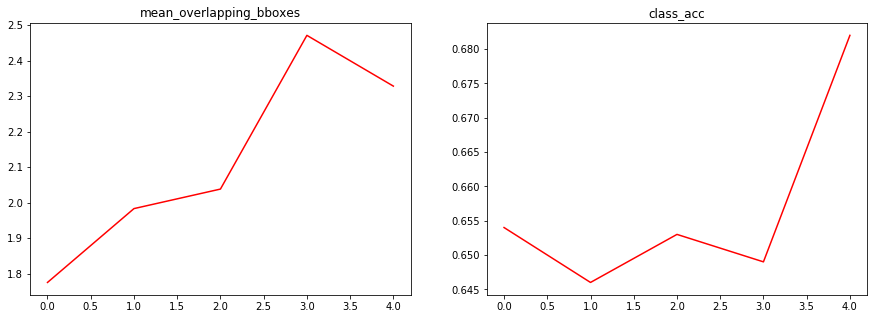

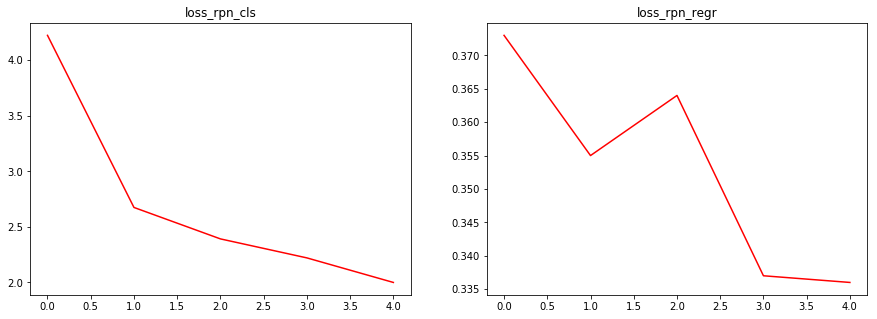

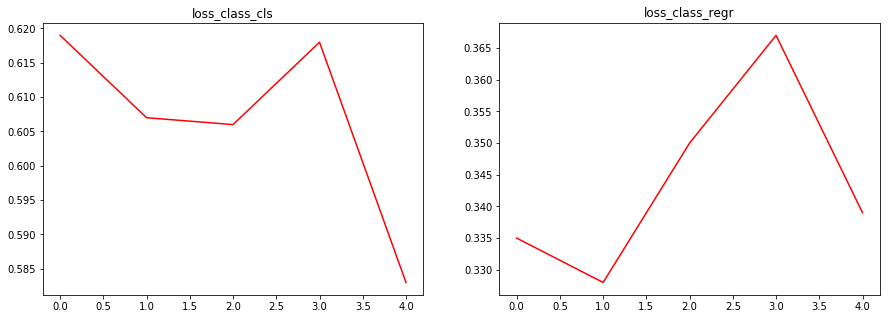

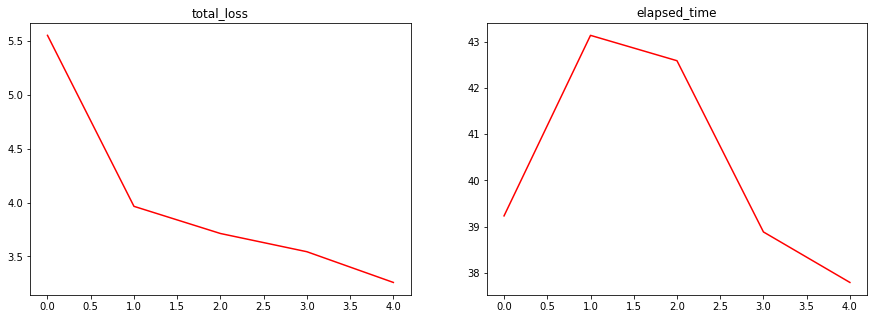

In [21]:
# Load the records
record_df = pd.read_csv(C.record_path)

r_epochs = len(record_df)

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(np.arange(0, r_epochs), record_df['mean_overlapping_bboxes'], 'r')
plt.title('mean_overlapping_bboxes')

plt.subplot(1,2,2)
plt.plot(np.arange(0, r_epochs), record_df['class_acc'], 'r')
plt.title('class_acc')

plt.show()

plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(np.arange(0, r_epochs), record_df['loss_rpn_cls'], 'r')
plt.title('loss_rpn_cls')

plt.subplot(1,2,2)
plt.plot(np.arange(0, r_epochs), record_df['loss_rpn_regr'], 'r')
plt.title('loss_rpn_regr')
plt.show()
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(np.arange(0, r_epochs), record_df['loss_class_cls'], 'r')
plt.title('loss_class_cls')

plt.subplot(1,2,2)
plt.plot(np.arange(0, r_epochs), record_df['loss_class_regr'], 'r')
plt.title('loss_class_regr')
plt.show()
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(np.arange(0, r_epochs), record_df['curr_loss'], 'r')
plt.title('total_loss')

plt.subplot(1,2,2)
plt.plot(np.arange(0, r_epochs), record_df['elapsed_time'], 'r')
plt.title('elapsed_time')

plt.show()

In [22]:
def format_img_size(img, C):
	#print(img)
	""" formats the image size based on config """
	img_min_side = float(C.im_size)
	(height,width,_) = img.shape
		
	if width <= height:
		ratio = img_min_side/width
		new_height = int(ratio * height)
		new_width = int(img_min_side)
	else:
		ratio = img_min_side/height
		new_width = int(ratio * width)
		new_height = int(img_min_side)
	img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_CUBIC)
	return img, ratio	

def format_img_channels(img, C):
	""" formats the image channels based on config """
	img = img[:, :, (2, 1, 0)]
	img = img.astype(np.float32)
	img[:, :, 0] -= C.img_channel_mean[0]
	img[:, :, 1] -= C.img_channel_mean[1]
	img[:, :, 2] -= C.img_channel_mean[2]
	img /= C.img_scaling_factor
	img = np.transpose(img, (2, 0, 1))
	img = np.expand_dims(img, axis=0)
	return img

def format_img(img, C):
	""" formats an image for model prediction based on config """
	img, ratio = format_img_size(img, C)
	img = format_img_channels(img, C)
	return img, ratio

# Method to transform the coordinates of the bounding box to its original size
def get_real_coordinates(ratio, x1, y1, x2, y2):

	real_x1 = int(round(x1 // ratio))
	real_y1 = int(round(y1 // ratio))
	real_x2 = int(round(x2 // ratio))
	real_y2 = int(round(y2 // ratio))

	return (real_x1, real_y1, real_x2 ,real_y2)

In [23]:
num_features = 1024

input_shape_img = (None, None, 3)
input_shape_features = (None, None, num_features)

img_input = Input(shape=input_shape_img)
roi_input = Input(shape=(C.num_rois, 4))
feature_map_input = Input(shape=input_shape_features)

# define the base network (VGG here, can be Resnet50, Inception, etc)
shared_layers = nn_base(img_input, trainable=True)

# define the RPN, built on the base layers
num_anchors = len(C.anchor_box_scales) * len(C.anchor_box_ratios)
rpn_layers = rpn_layer(shared_layers, num_anchors)

classifier = classifier_layer(feature_map_input, roi_input, C.num_rois, nb_classes=len(C.class_mapping))

model_rpn = Model(img_input, rpn_layers)
model_classifier_only = Model([feature_map_input, roi_input], classifier)

model_classifier = Model([feature_map_input, roi_input], classifier)

print('Loading weights from {}'.format(C.model_path))
model_rpn.load_weights(C.model_path, by_name=True)
model_classifier.load_weights(C.model_path, by_name=True)

model_rpn.compile(optimizer='sgd', loss='mse')
model_classifier.compile(optimizer='sgd', loss='mse')

NOTE: this code only support to keras 2.0.3, newest version this line will got errors. see trace back.
Loading weights from Dataset\model/model_frcnn_resnet50.hdf5


In [24]:
# Switch key value for class mapping
class_mapping = C.class_mapping
class_mapping = {v: k for k, v in class_mapping.items()}
print(class_mapping)
class_to_color = {class_mapping[v]: np.random.randint(0, 255, 3) for v in class_mapping}

{0: 'Lung Opacity', 1: 'bg'}


In [25]:
test_imgs = os.listdir(test_base_path)

imgs_path = []
for i in range(50):
	idx = np.random.randint(len(test_imgs))
	imgs_path.append(test_imgs[idx])

all_imgs = []

classes = {}

d86c6699-534d-4396-ad9c-49c978acbcec.jpg
Elapsed time = 3.3343145847320557
[('Lung Opacity', 71.56200408935547)]


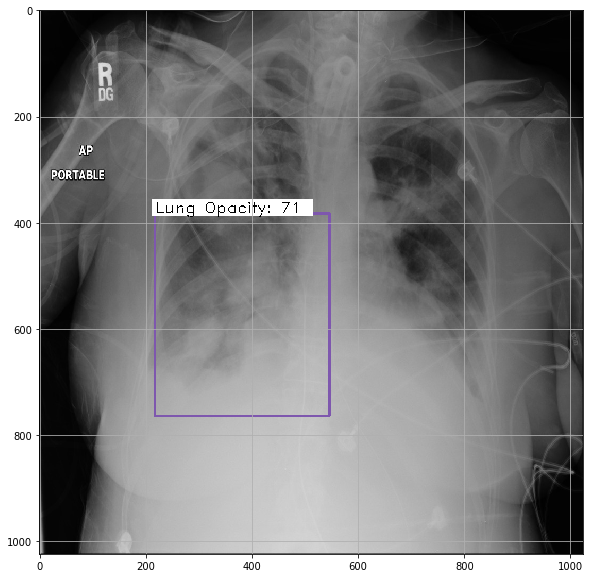

b1f3050c-2d03-4b69-984b-ef913787d774.jpg
Elapsed time = 2.594330310821533
[]


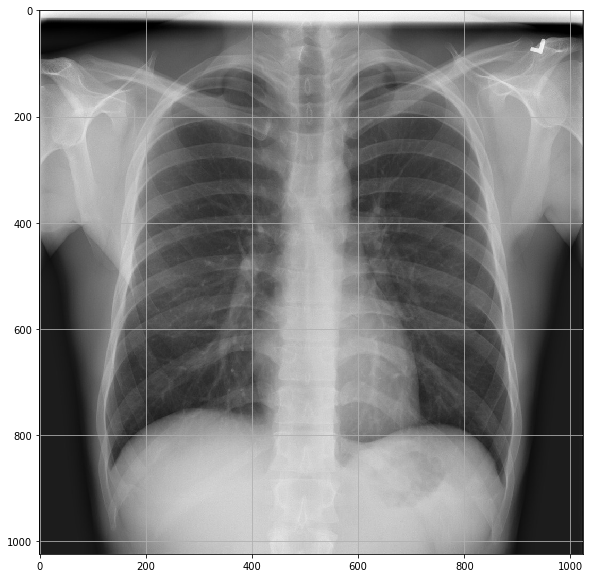

4637f5df-19c7-406d-829a-aafa747821ec.jpg
Elapsed time = 2.540064573287964
[('Lung Opacity', 71.71010971069336)]


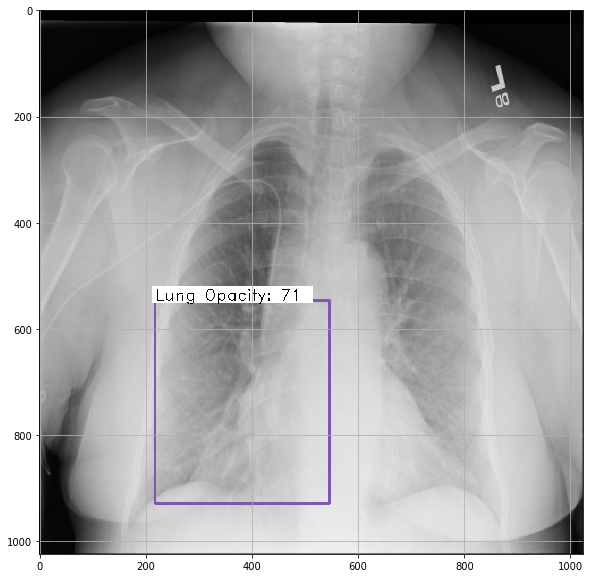

49e2aae8-864d-42df-bd4d-f52c8f261c80.jpg
Elapsed time = 2.6805827617645264
[('Lung Opacity', 70.10077834129333)]


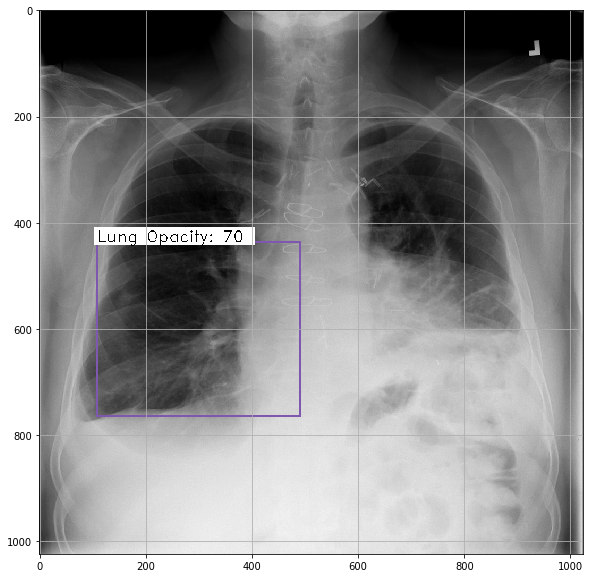

b0968835-7055-4ddd-8b6c-651c15dc7eab.jpg
Elapsed time = 2.7558395862579346
[]


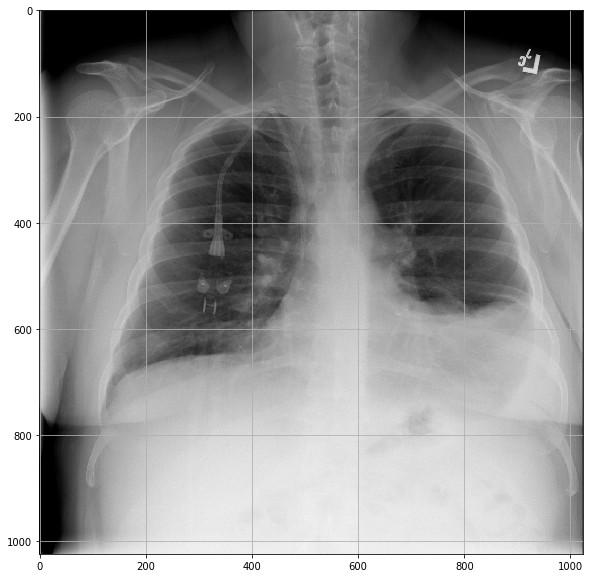

31879a79-c1a3-4141-812f-efa51729f1de.jpg
Elapsed time = 2.6886837482452393
[]


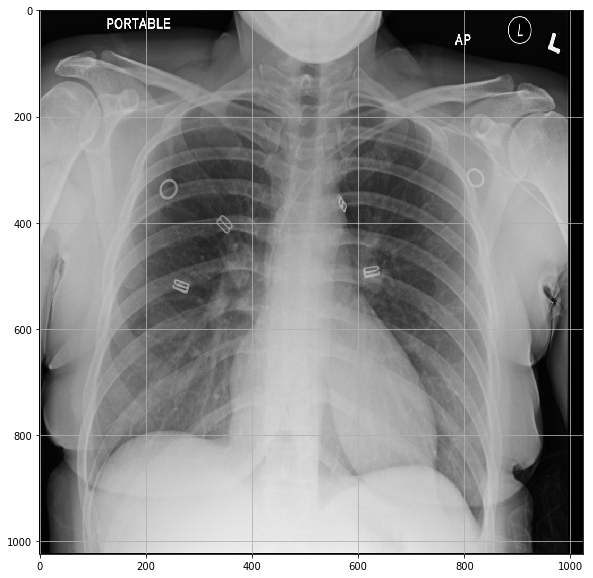

5b19f8e2-420c-42a8-82d5-5e1e5d30939b.jpg
Elapsed time = 2.4230329990386963
[('Lung Opacity', 71.91324234008789)]


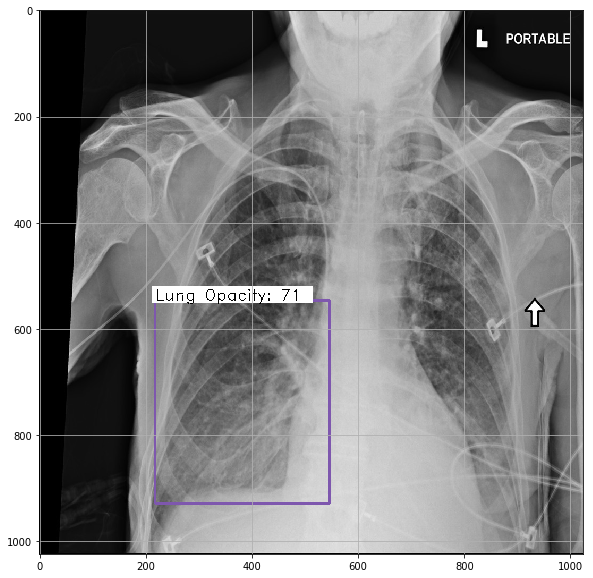

799c5159-a2fb-4e25-8f90-13d3e1c66354.jpg
Elapsed time = 2.6148953437805176
[]


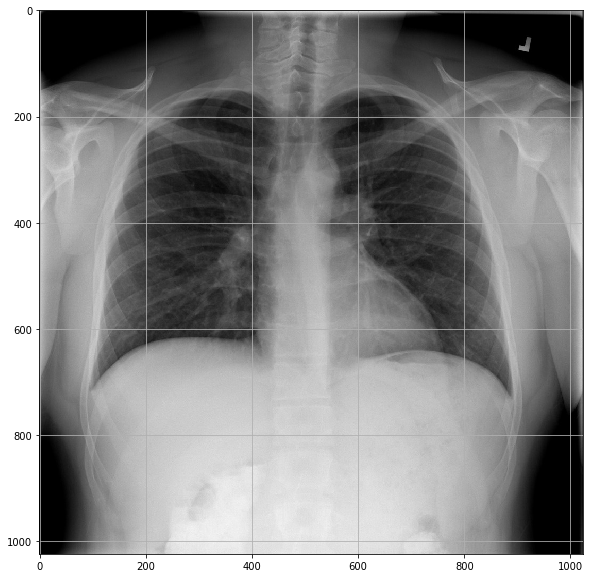

8721de5e-f6c8-4af0-a695-356e969f4687.jpg
Elapsed time = 2.571859121322632
[]


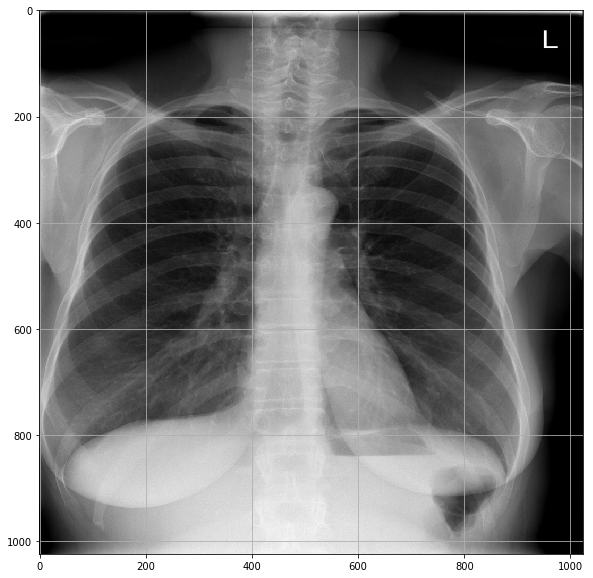

6670ddd7-80da-4ffe-a216-3fa7c1c741a5.jpg
Elapsed time = 2.692796468734741
[]


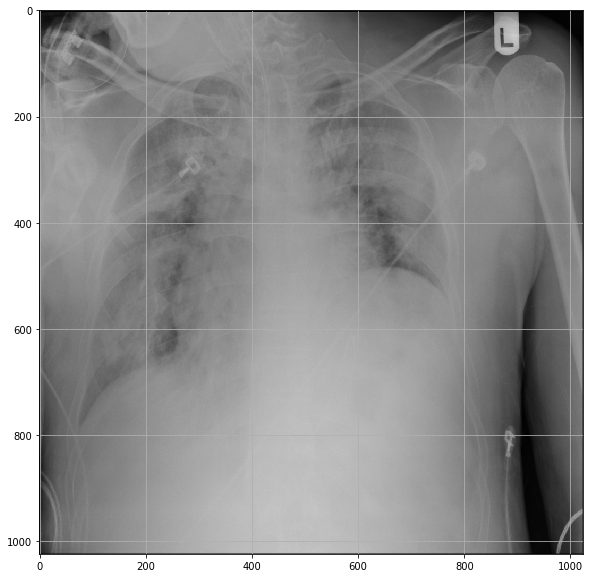

704d9847-5f78-4639-a9c1-324bfab30602.jpg
Elapsed time = 2.3506669998168945
[]


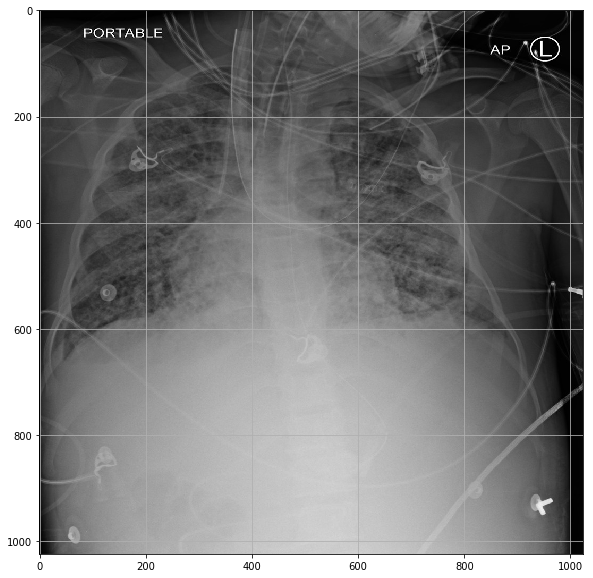

5f81b127-8dfa-4499-ba57-93c229cc44f4.jpg
Elapsed time = 2.3583455085754395
[]


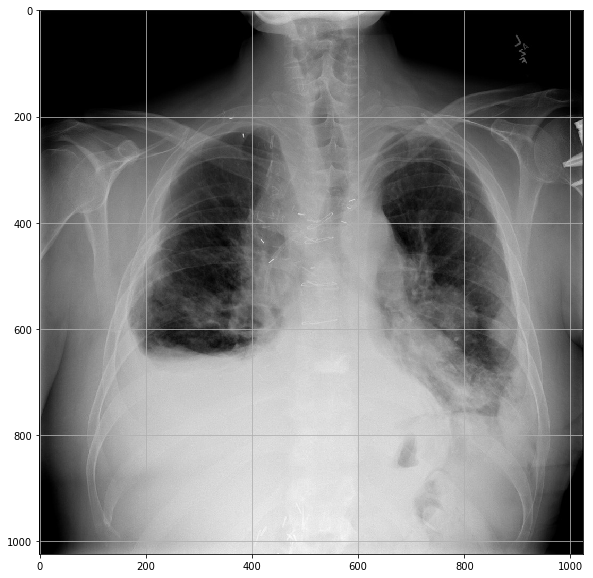

ed386e07-da6b-479a-b0db-a1a40f9bd068.jpg
Elapsed time = 2.361288547515869
[]


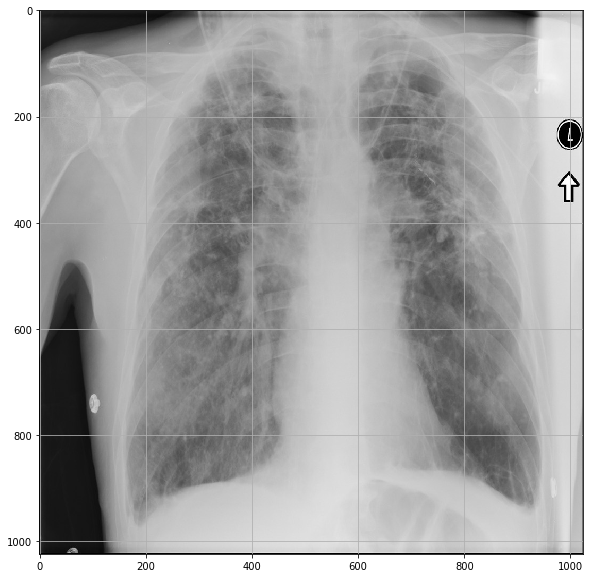

a3215a02-302a-40c7-ab0e-e1159cce77f6.jpg
Elapsed time = 2.372731924057007
[]


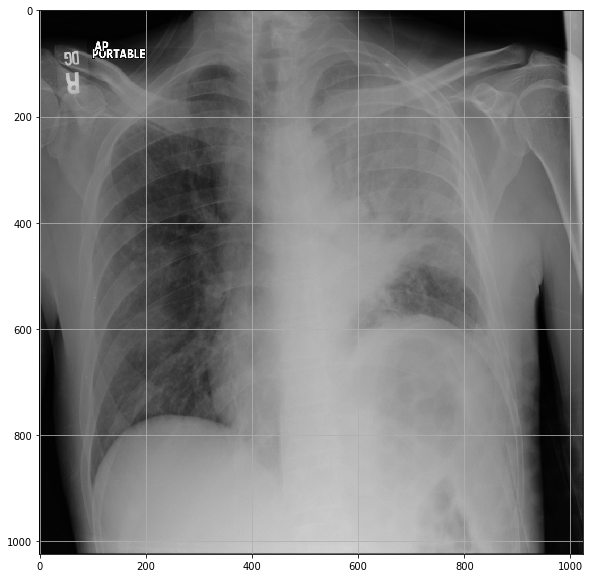

cf13c527-ed56-4c9b-a1ac-27707e6f14da.jpg
Elapsed time = 2.319624185562134
[]


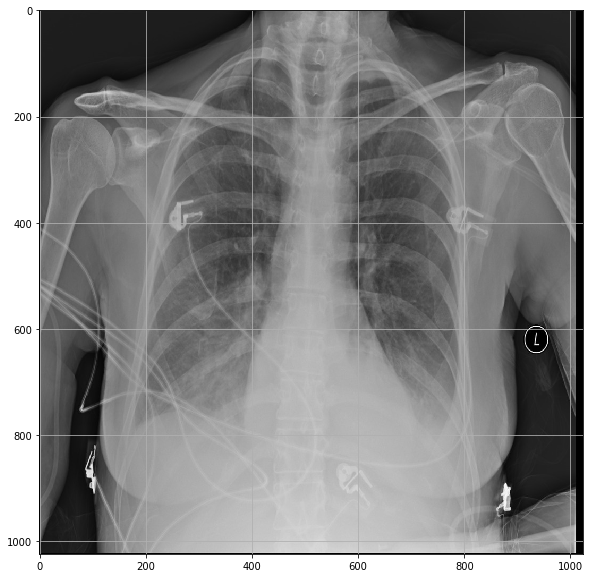

542836b4-9b88-4b90-85ce-e8a1f4971685.jpg
Elapsed time = 2.3288795948028564
[]


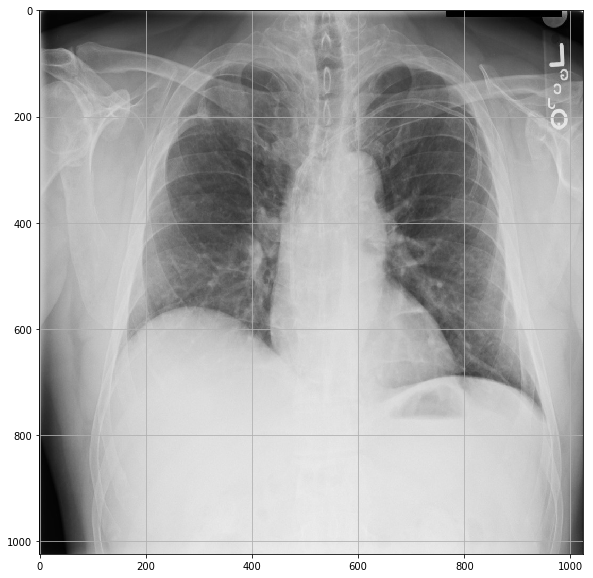

981434e7-a87f-4cbb-8fc5-ac7f5ca0cd9f.jpg
Elapsed time = 2.319234848022461
[]


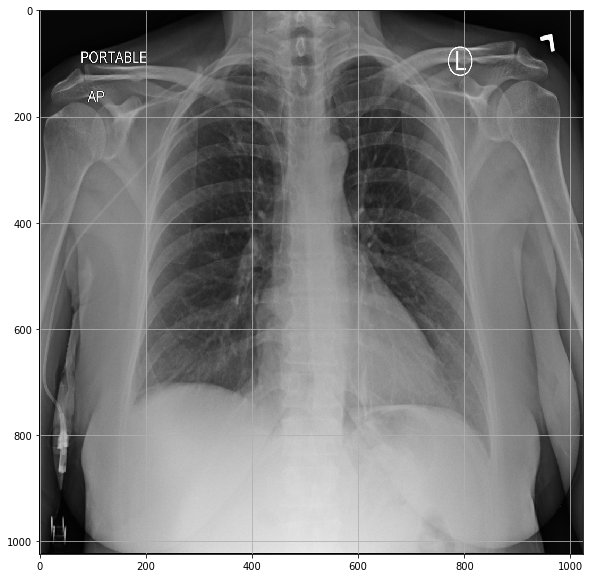

3473faaf-3f36-433b-aa8f-4e69a9948d18.jpg
Elapsed time = 2.473118782043457
[]


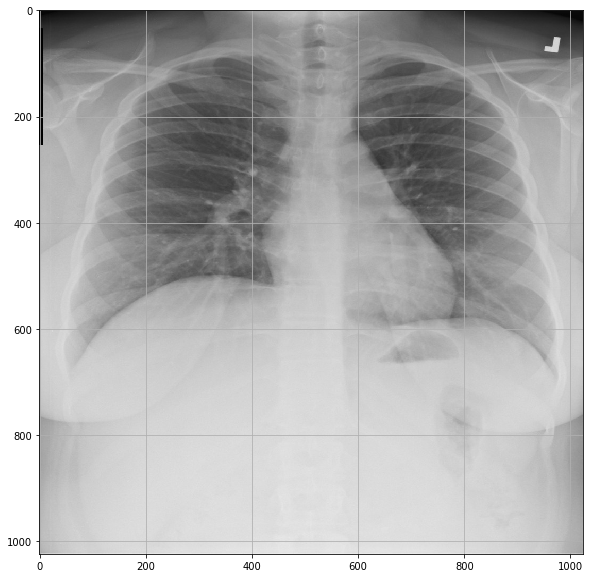

ea2f5da1-f25e-4f5b-9e3e-c2e49e93cbac.jpg
Elapsed time = 2.3386218547821045
[]


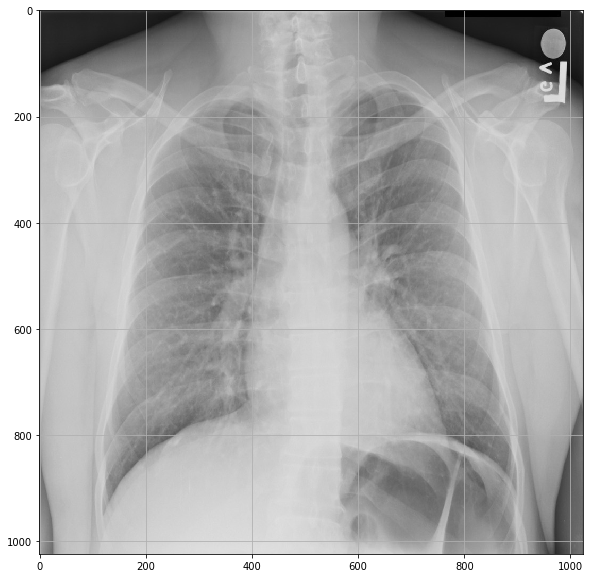

bbed1677-6d08-4793-8ddc-7111cb39c0e7.jpg
Elapsed time = 2.409503221511841
[]


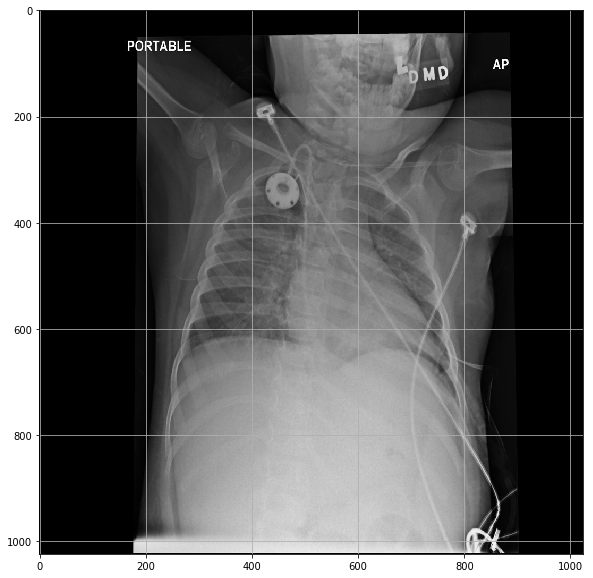

c208db34-d893-4a2b-9cf2-45490f5b78a3.jpg
Elapsed time = 2.3354995250701904
[]


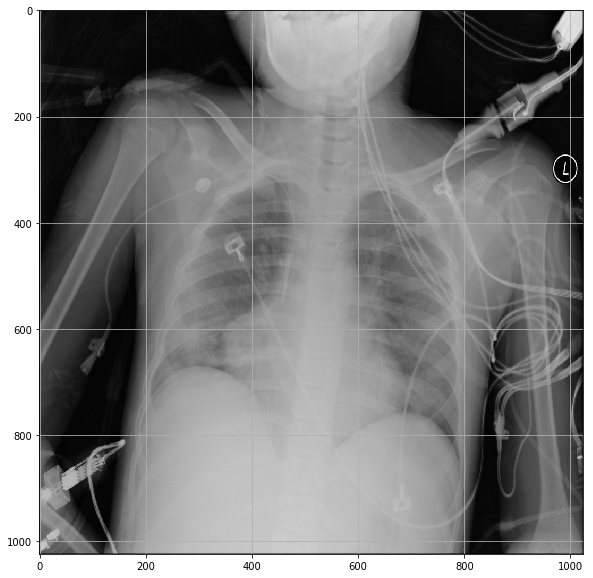

90440659-a140-451d-9ddb-2908d4408c93.jpg
Elapsed time = 2.3088855743408203
[]


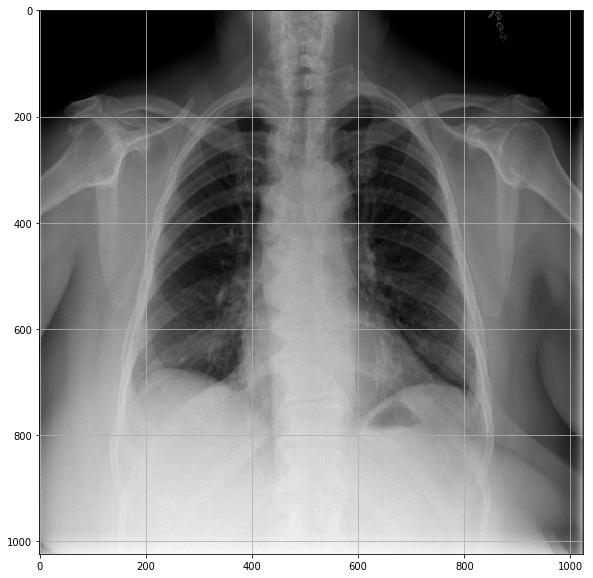

321b9103-0c96-4719-912d-b9b94e222077.jpg
Elapsed time = 2.2993111610412598
[('Lung Opacity', 71.61726951599121)]


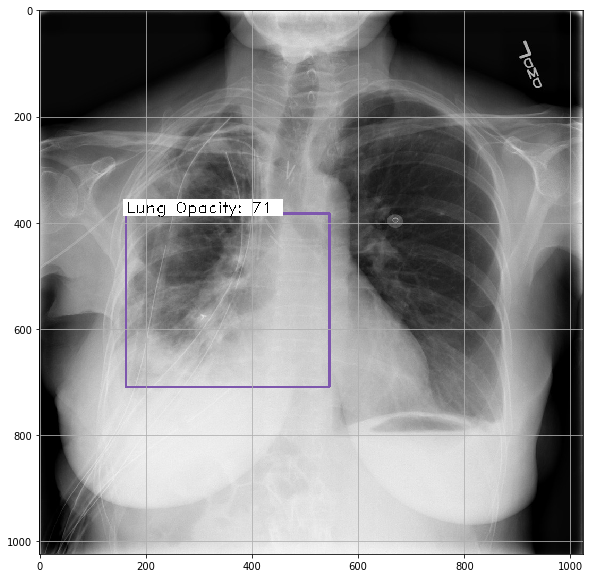

ffde3e7e-849c-4077-bfd0-4e4498ee8817.jpg
Elapsed time = 2.360499620437622
[]


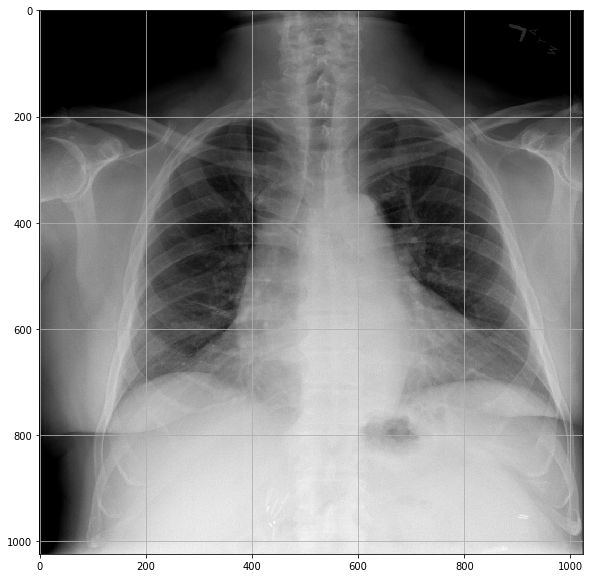

4ff5efa2-6d57-4fc7-ab29-2b2504d1aeba.jpg
Elapsed time = 2.3202171325683594
[]


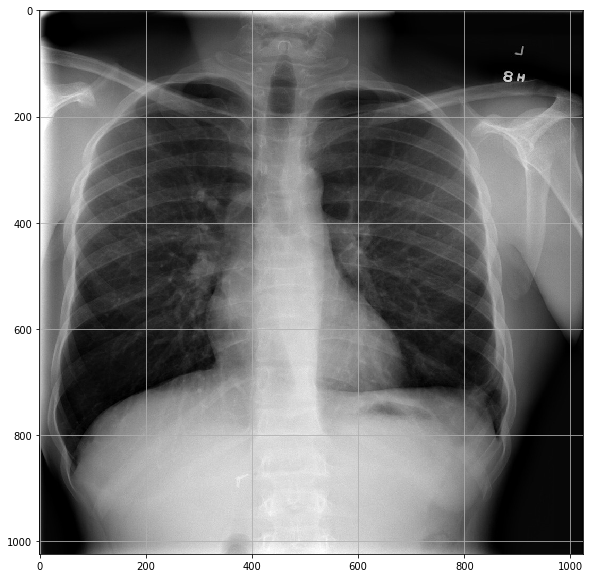

b5584268-210f-4a00-84fb-24ab79967921.jpg
Elapsed time = 2.320796489715576
[]


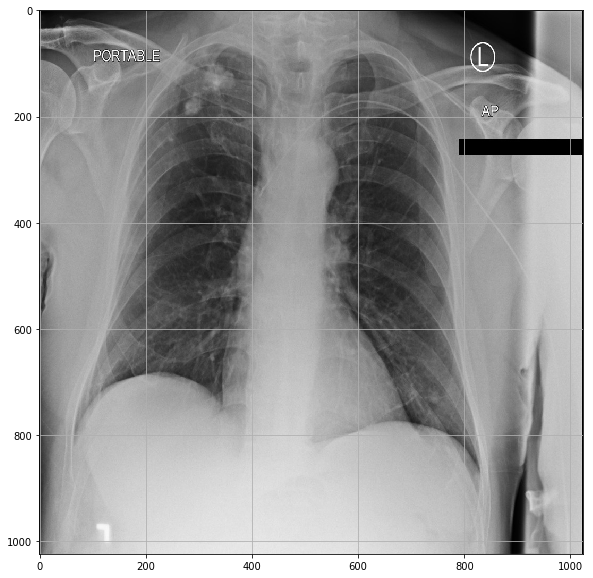

a450a1e3-e46b-4b1a-a8d0-c07c894e4190.jpg
Elapsed time = 2.3522045612335205
[]


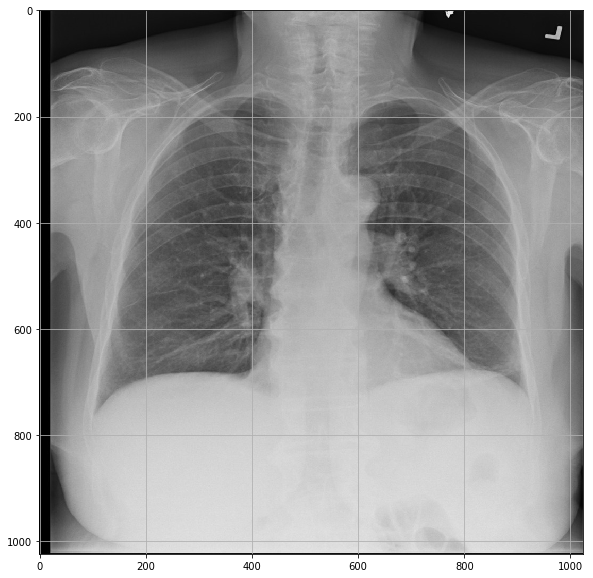

181f1705-1f44-4768-8f36-547c4e7c4d90.jpg
Elapsed time = 2.3142926692962646
[]


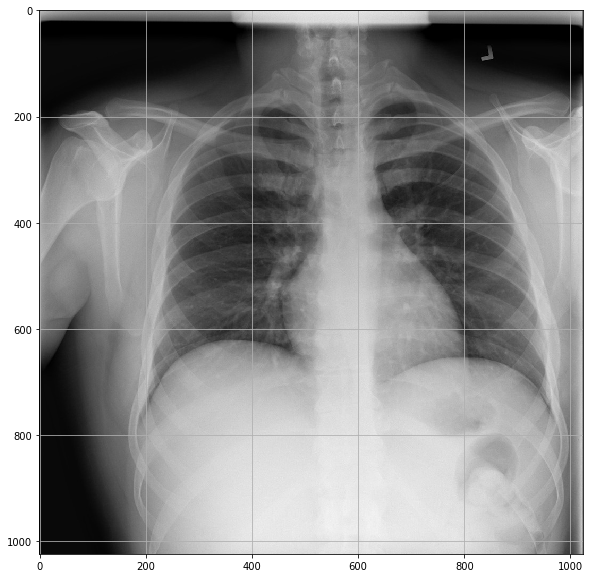

af487ec4-2066-4e6b-b60e-dd5568e9aea1.jpg
Elapsed time = 2.35473370552063
[('Lung Opacity', 73.6453115940094)]


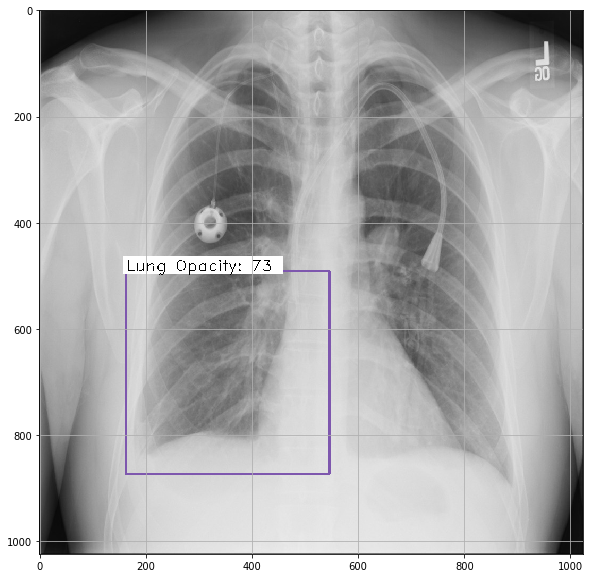

3bb78602-d19d-4418-a505-435e52fbf1ba.jpg
Elapsed time = 2.329770565032959
[('Lung Opacity', 72.72219061851501)]


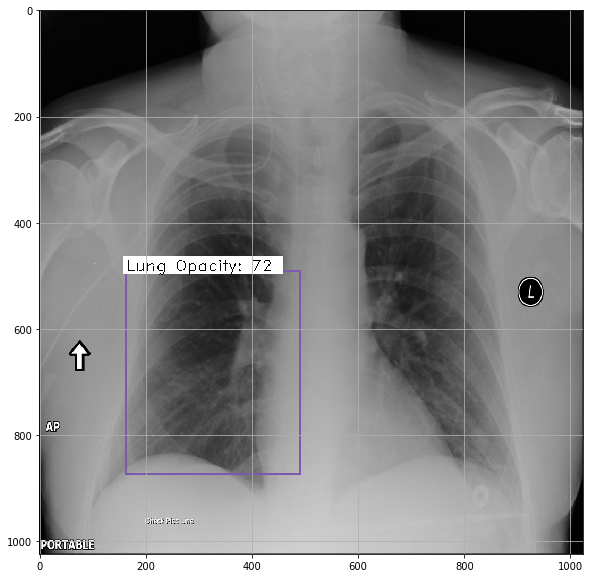

eb3d5fed-558d-4aba-b13e-f7917c49c79b.jpg
Elapsed time = 2.5366668701171875
[('Lung Opacity', 71.42118215560913)]


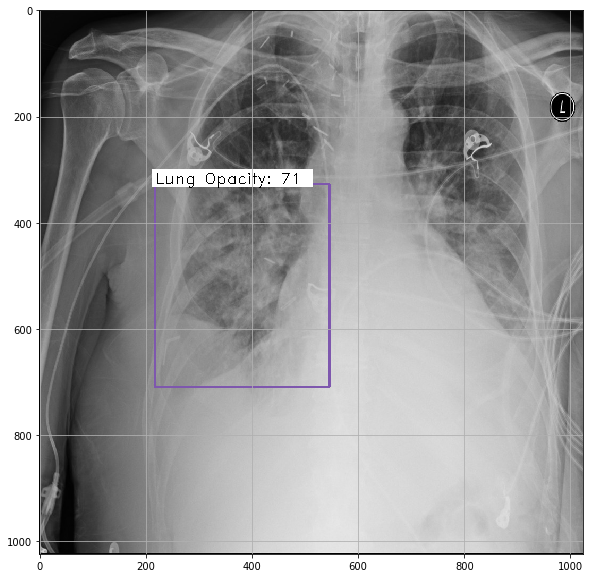

81303474-5051-4639-bf44-5bf4f67ec2f9.jpg
Elapsed time = 2.4814960956573486
[]


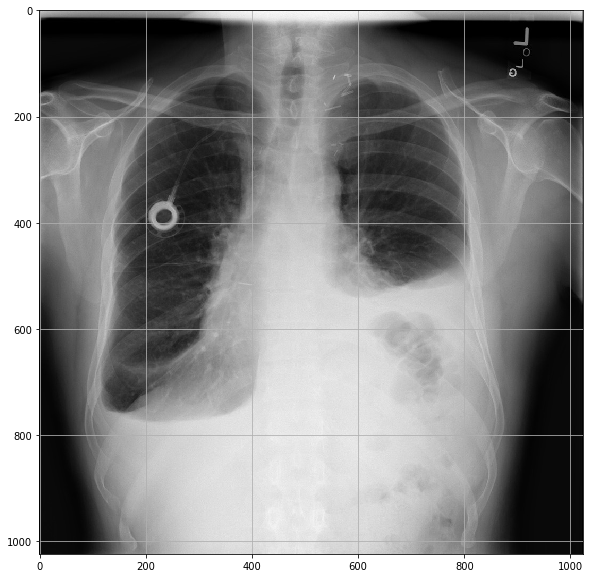

8cb8c2bf-22a9-48a8-bbc6-5214070a60da.jpg
Elapsed time = 2.393990993499756
[]


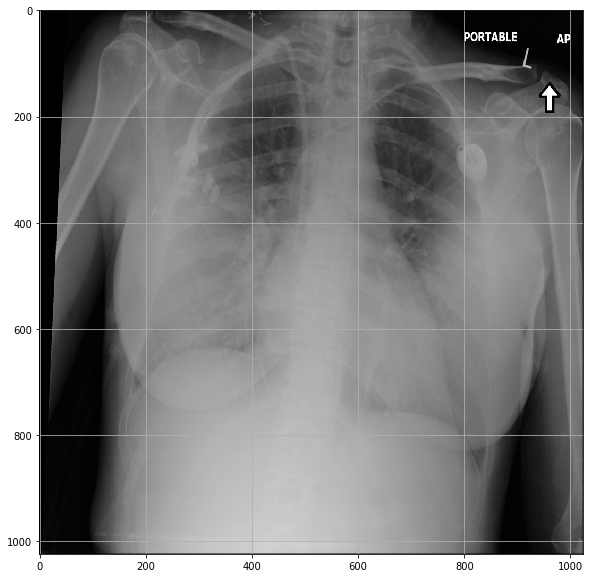

c85b9a9a-3ea9-44e8-bac3-8d9e07a73085.jpg
Elapsed time = 5.027165651321411
[]


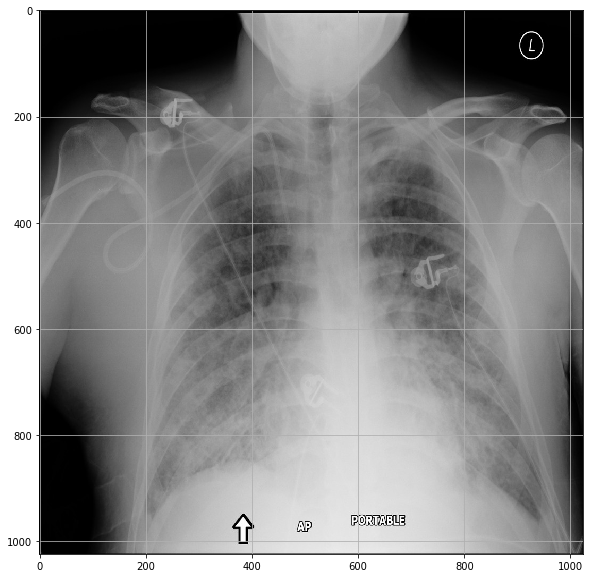

45300d8a-45dc-4afc-8fcf-8421d239355c.jpg
Elapsed time = 3.7200207710266113
[]


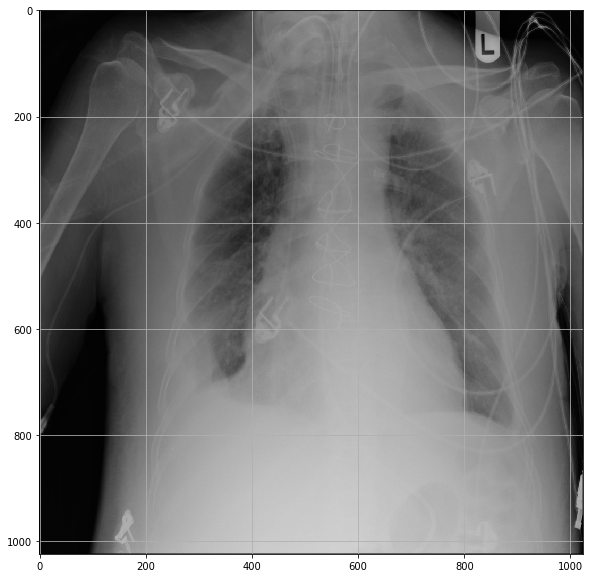

0b323a31-28e6-45b2-a07c-cc9b60571053.jpg
Elapsed time = 3.5801491737365723
[]


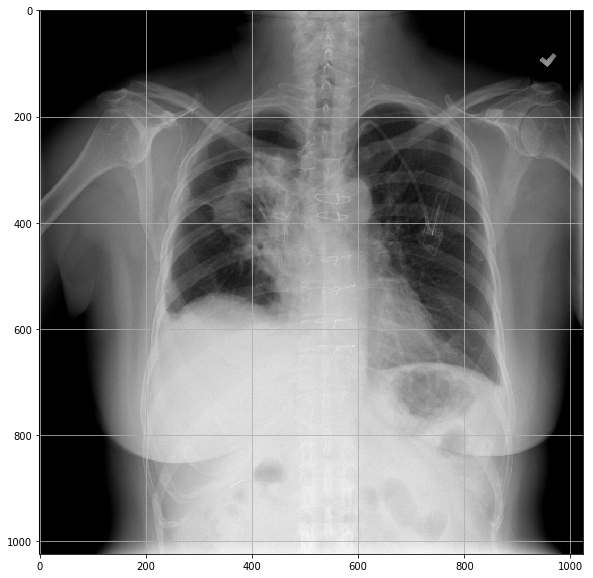

2cf61db7-101c-4430-ae32-949b5a62f653.jpg
Elapsed time = 3.606611490249634
[]


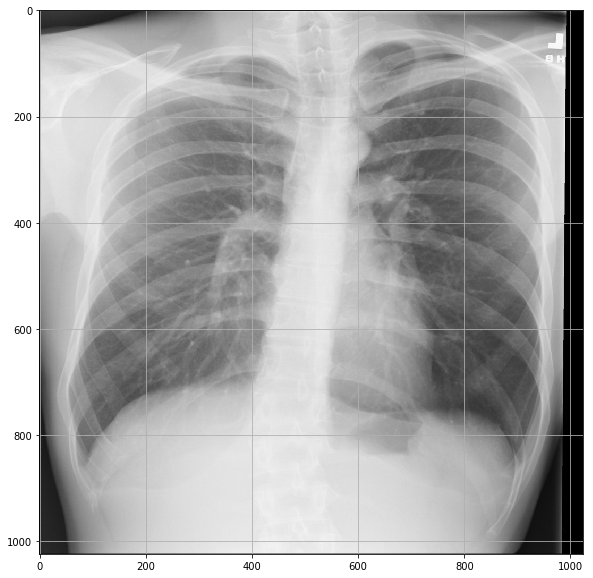

75fbf88e-0f1b-4bc2-acc9-01f9cdee479d.jpg
Elapsed time = 3.909792184829712
[]


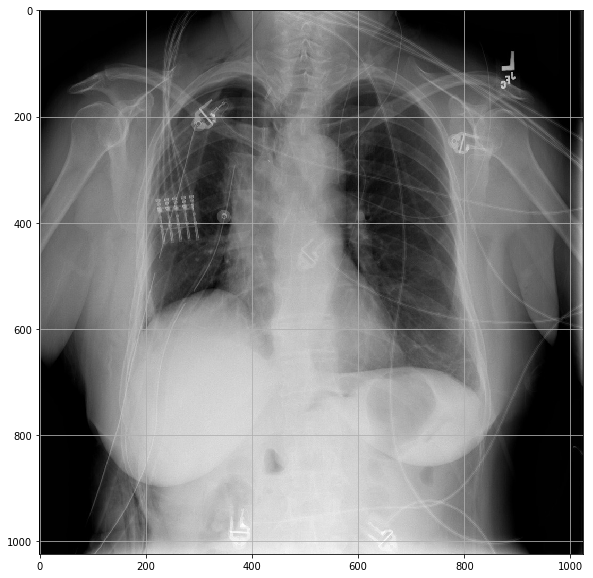

4fdf94b9-86bf-42fc-b084-d5deabb568fe.jpg
Elapsed time = 3.7255189418792725
[]


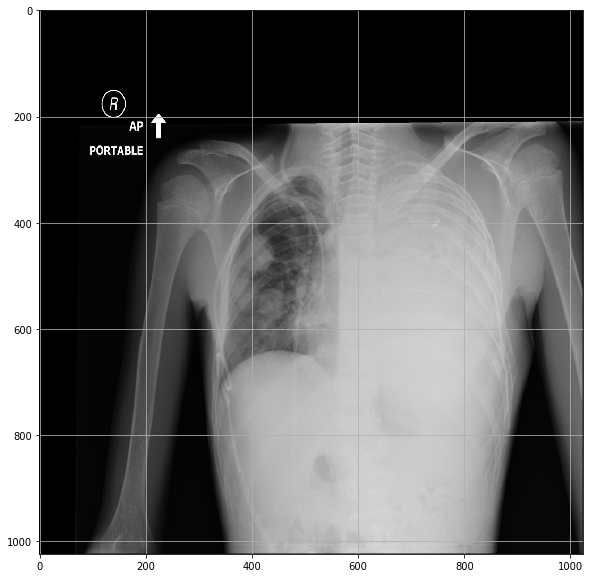

0be1f228-74f9-49f2-836e-e3caa49c9fcb.jpg
Elapsed time = 3.6006577014923096
[]


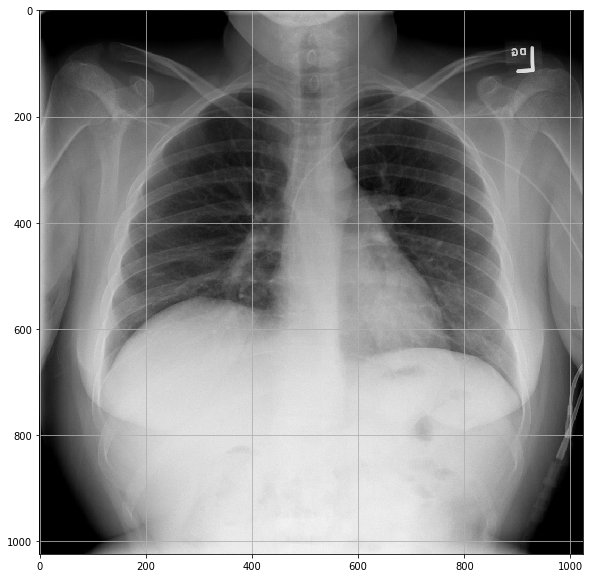

03c149d1-e420-40bf-8d60-f98d0fff1d48.jpg
Elapsed time = 3.6562118530273438
[]


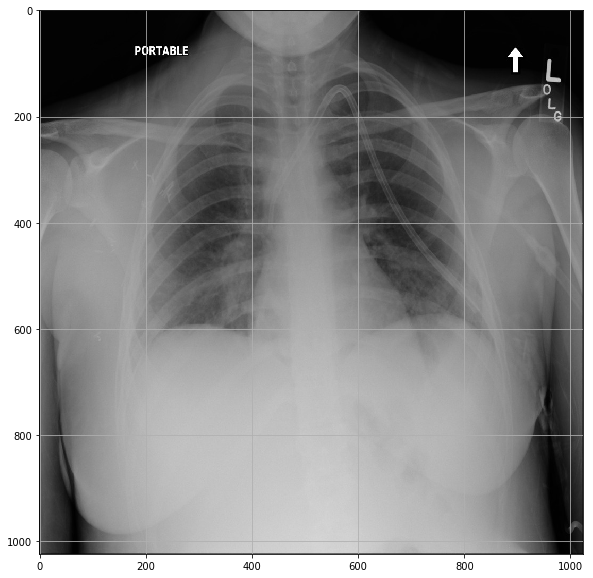

8c79e5d7-7862-4db1-8d88-062abff2e172.jpg
Elapsed time = 3.9431824684143066
[]


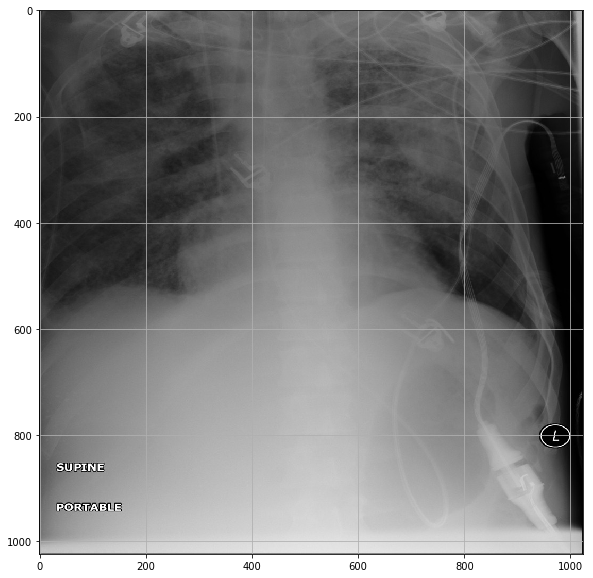

67222b15-7569-4c2d-b214-f3f613f4549b.jpg
Elapsed time = 4.213943958282471
[]


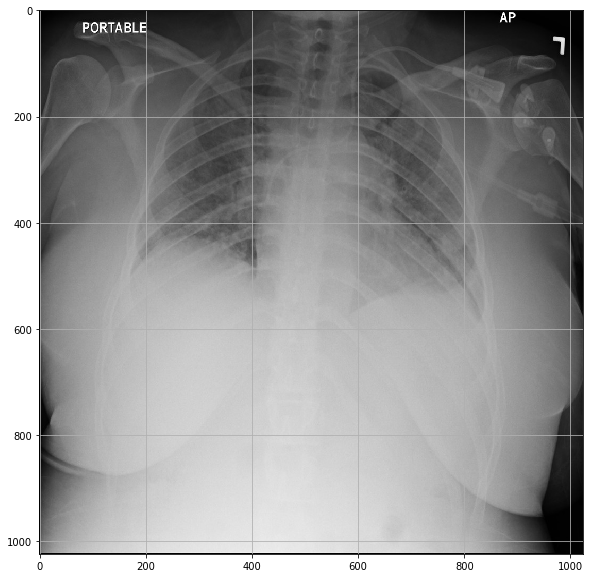

0790ee1e-70c5-4f8f-9b80-cd10ecfd90f2.jpg
Elapsed time = 3.6041035652160645
[]


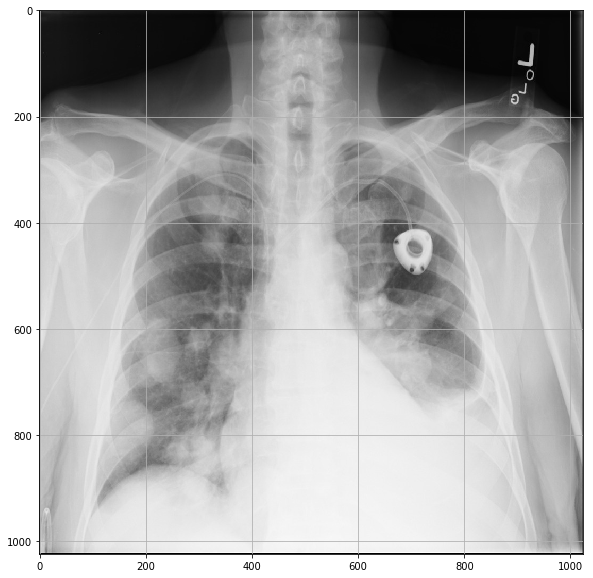

f35df256-c4bf-4767-b9ab-bdf429af9903.jpg
Elapsed time = 3.6361405849456787
[]


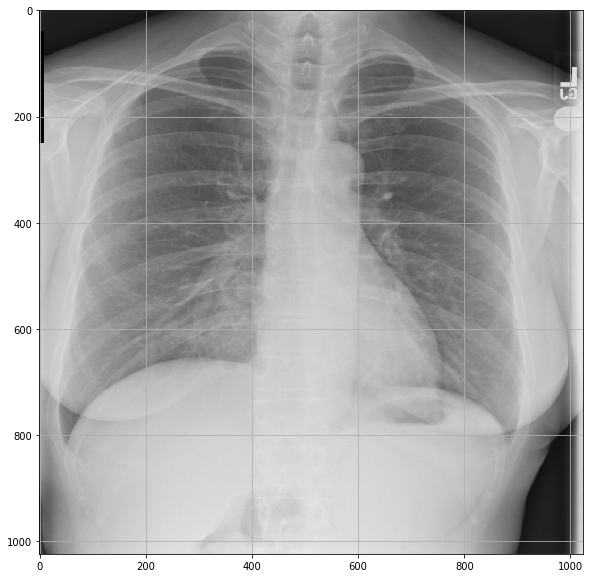

c797daee-ceb9-483b-8eca-008e7ac8015b.jpg
Elapsed time = 3.852886438369751
[]


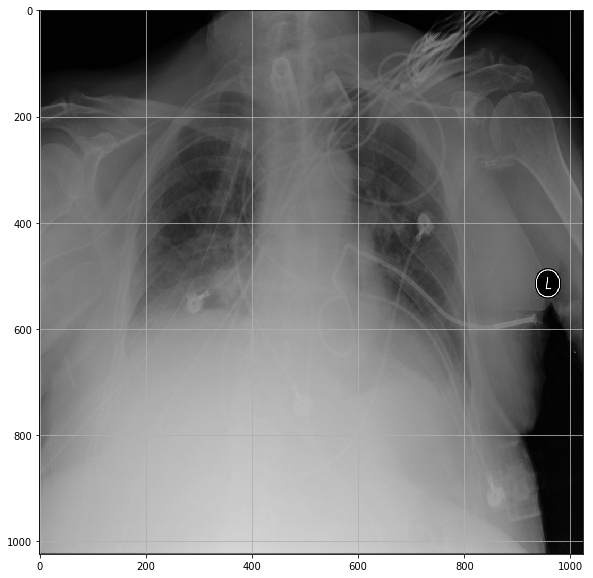

37817cfa-04c3-4b49-9c52-ae48743f68f3.jpg
Elapsed time = 3.8418405055999756
[]


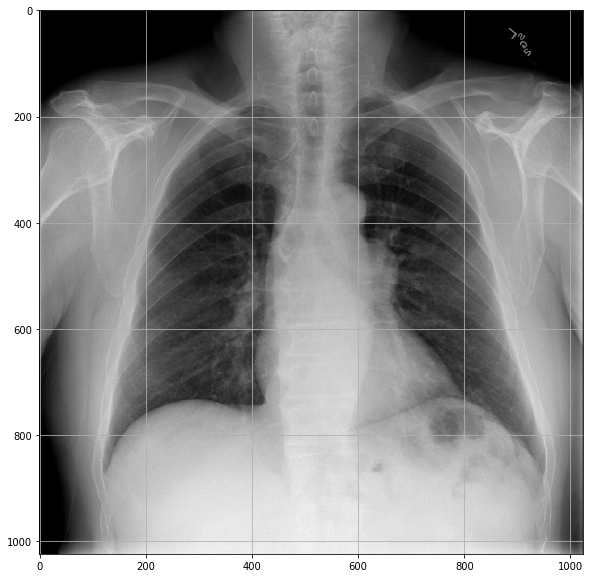

a131840e-a6b9-4672-a837-e244596447ce.jpg
Elapsed time = 3.809551954269409
[]


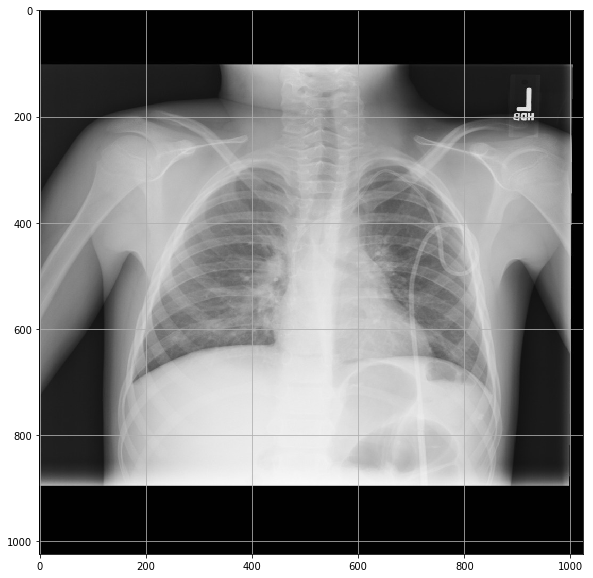

5503ca33-0018-468a-a0a1-c5d8b8bf8321.jpg
Elapsed time = 3.8605709075927734
[]


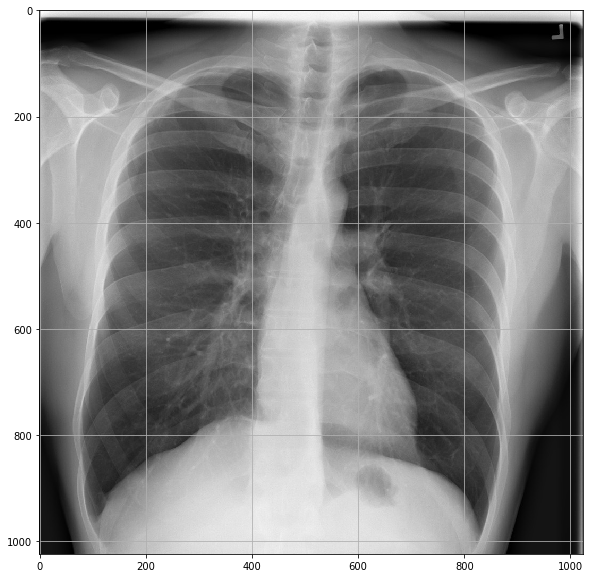

75d91c02-dac0-493d-9ed6-451b19ffb124.jpg
Elapsed time = 3.8567330837249756
[]


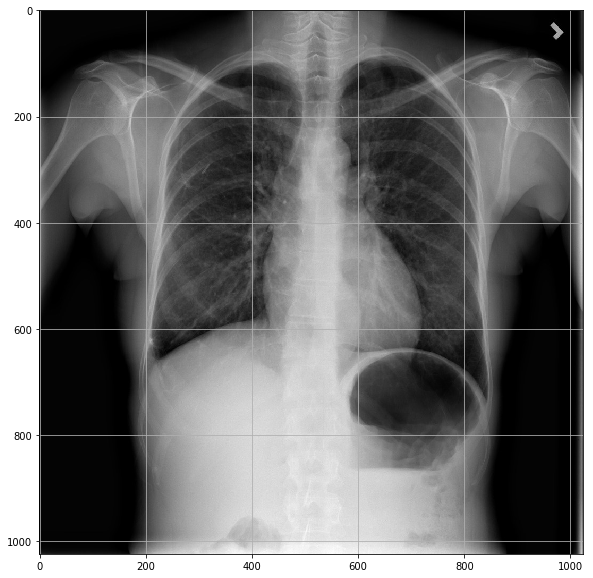

In [26]:
# If the box classification value is less than this, we ignore this box
bbox_threshold = 0.7

for idx, img_name in enumerate(imgs_path):
    if not img_name.lower().endswith(('.bmp', '.jpeg', '.jpg', '.png', '.tif', '.tiff')):
        continue
    print(img_name)
    st = time.time()
    filepath = os.path.join(test_base_path, img_name)

    img = cv2.imread(filepath)

    X, ratio = format_img(img, C)
    
    X = np.transpose(X, (0, 2, 3, 1))

    # get output layer Y1, Y2 from the RPN and the feature maps F
    # Y1: y_rpn_cls
    # Y2: y_rpn_regr
    [Y1, Y2, F] = model_rpn.predict(X)

    # Get bboxes by applying NMS 
    # R.shape = (300, 4)
    R = rpn_to_roi(Y1, Y2, C, K.common.image_dim_ordering(), overlap_thresh=0.7)

    # convert from (x1,y1,x2,y2) to (x,y,w,h)
    R[:, 2] -= R[:, 0]
    R[:, 3] -= R[:, 1]

    # apply the spatial pyramid pooling to the proposed regions
    bboxes = {}
    probs = {}

    for jk in range(R.shape[0]//C.num_rois + 1):
        ROIs = np.expand_dims(R[C.num_rois*jk:C.num_rois*(jk+1), :], axis=0)
        if ROIs.shape[1] == 0:
            break

        if jk == R.shape[0]//C.num_rois:
            #pad R
            curr_shape = ROIs.shape
            target_shape = (curr_shape[0],C.num_rois,curr_shape[2])
            ROIs_padded = np.zeros(target_shape).astype(ROIs.dtype)
            ROIs_padded[:, :curr_shape[1], :] = ROIs
            ROIs_padded[0, curr_shape[1]:, :] = ROIs[0, 0, :]
            ROIs = ROIs_padded

        [P_cls, P_regr] = model_classifier_only.predict([F, ROIs])

        # Calculate bboxes coordinates on resized image
        for ii in range(P_cls.shape[1]):
            # Ignore 'bg' class
            if np.max(P_cls[0, ii, :]) < bbox_threshold or np.argmax(P_cls[0, ii, :]) == (P_cls.shape[2] - 1):
                continue

            cls_name = class_mapping[np.argmax(P_cls[0, ii, :])]

            if cls_name not in bboxes:
                bboxes[cls_name] = []
                probs[cls_name] = []

            (x, y, w, h) = ROIs[0, ii, :]

            cls_num = np.argmax(P_cls[0, ii, :])
            try:
                (tx, ty, tw, th) = P_regr[0, ii, 4*cls_num:4*(cls_num+1)]
                tx /= C.classifier_regr_std[0]
                ty /= C.classifier_regr_std[1]
                tw /= C.classifier_regr_std[2]
                th /= C.classifier_regr_std[3]
                x, y, w, h = apply_regr(x, y, w, h, tx, ty, tw, th)
            except:
                pass
            bboxes[cls_name].append([C.rpn_stride*x, C.rpn_stride*y, C.rpn_stride*(x+w), C.rpn_stride*(y+h)])
            probs[cls_name].append(np.max(P_cls[0, ii, :]))

    all_dets = []

    for key in bboxes:
        bbox = np.array(bboxes[key])

        new_boxes, new_probs = non_max_suppression_fast(bbox, np.array(probs[key]), overlap_thresh=0.2)
        for jk in range(new_boxes.shape[0]):
            (x1, y1, x2, y2) = new_boxes[jk,:]

            # Calculate real coordinates on original image
            (real_x1, real_y1, real_x2, real_y2) = get_real_coordinates(ratio, x1, y1, x2, y2)

            cv2.rectangle(img,(real_x1, real_y1), (real_x2, real_y2), (int(class_to_color[key][0]), int(class_to_color[key][1]), int(class_to_color[key][2])),4)

            textLabel = '{}: {}'.format(key,int(100*new_probs[jk]))
            all_dets.append((key,100*new_probs[jk]))

            (retval,baseLine) = cv2.getTextSize(textLabel,cv2.FONT_HERSHEY_COMPLEX,1,1)
            textOrg = (real_x1, real_y1-0)

            cv2.rectangle(img, (textOrg[0] - 5, textOrg[1]+baseLine - 5), (textOrg[0]+retval[0] + 5, textOrg[1]-retval[1] - 5), (0, 0, 0), 1)
            cv2.rectangle(img, (textOrg[0] - 5,textOrg[1]+baseLine - 5), (textOrg[0]+retval[0] + 5, textOrg[1]-retval[1] - 5), (255, 255, 255), -1)
            cv2.putText(img, textLabel, textOrg, cv2.FONT_HERSHEY_DUPLEX, 1, (0, 0, 0), 1)

    print('Elapsed time = {}'.format(time.time() - st))
    print(all_dets)
    plt.figure(figsize=(10,10))
    plt.grid()
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.show()

In [27]:
def get_map(pred, gt, f):
	T = {}
	P = {}
	fx, fy = f

	for bbox in gt:
		bbox['bbox_matched'] = False

	pred_probs = np.array([s['prob'] for s in pred])
	box_idx_sorted_by_prob = np.argsort(pred_probs)[::-1]

	for box_idx in box_idx_sorted_by_prob:
		pred_box = pred[box_idx]
		pred_class = pred_box['class']
		pred_x1 = pred_box['x1']
		pred_x2 = pred_box['x2']
		pred_y1 = pred_box['y1']
		pred_y2 = pred_box['y2']
		pred_prob = pred_box['prob']
		if pred_class not in P:
			P[pred_class] = []
			T[pred_class] = []
		P[pred_class].append(pred_prob)
		found_match = False

		for gt_box in gt:
			gt_class = gt_box['class']
			gt_x1 = gt_box['x1']/fx
			gt_x2 = gt_box['x2']/fx
			gt_y1 = gt_box['y1']/fy
			gt_y2 = gt_box['y2']/fy
			gt_seen = gt_box['bbox_matched']
			if gt_class != pred_class:
				continue
			if gt_seen:
				continue
			iou_map = iou((pred_x1, pred_y1, pred_x2, pred_y2), (gt_x1, gt_y1, gt_x2, gt_y2))
			if iou_map >= 0.5:
				found_match = True
				gt_box['bbox_matched'] = True
				break
			else:
				continue

		T[pred_class].append(int(found_match))

	for gt_box in gt:
		if not gt_box['bbox_matched']:# and not gt_box['difficult']:
			if gt_box['class'] not in P:
				P[gt_box['class']] = []
				T[gt_box['class']] = []

			T[gt_box['class']].append(1)
			P[gt_box['class']].append(0)

	#import pdb
	#pdb.set_trace()
	return T, P

In [28]:
def format_img_map(img, C):
	"""Format image for mAP. Resize original image to C.im_size (300 in here)

	Args:
		img: cv2 image
		C: config

	Returns:
		img: Scaled and normalized image with expanding dimension
		fx: ratio for width scaling
		fy: ratio for height scaling
	"""

	img_min_side = float(C.im_size)
	(height,width,_) = img.shape
	
	if width <= height:
		f = img_min_side/width
		new_height = int(f * height)
		new_width = int(img_min_side)
	else:
		f = img_min_side/height
		new_width = int(f * width)
		new_height = int(img_min_side)
	fx = width/float(new_width)
	fy = height/float(new_height)
	img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_CUBIC)
	# Change image channel from BGR to RGB
	img = img[:, :, (2, 1, 0)]
	img = img.astype(np.float32)
	img[:, :, 0] -= C.img_channel_mean[0]
	img[:, :, 1] -= C.img_channel_mean[1]
	img[:, :, 2] -= C.img_channel_mean[2]
	img /= C.img_scaling_factor
	# Change img shape from (height, width, channel) to (channel, height, width)
	img = np.transpose(img, (2, 0, 1))
	# Expand one dimension at axis 0
	# img shape becames (1, channel, height, width)
	img = np.expand_dims(img, axis=0)
	return img, fx, fy

In [29]:
print(class_mapping)

{0: 'Lung Opacity', 1: 'bg'}


In [30]:
# This might takes a while to parser the data
test_imgs, _, _ = get_data(test_path)

Parsing annotation files
idx=1909

In [31]:
T = {}
P = {}
mAPs = []
for idx, img_data in enumerate(test_imgs):
    print('{}/{}'.format(idx,len(test_imgs)))
    st = time.time()
    filepath = img_data['filepath']

    img = cv2.imread(filepath)

    X, fx, fy = format_img_map(img, C)

    # Change X (img) shape from (1, channel, height, width) to (1, height, width, channel)
    X = np.transpose(X, (0, 2, 3, 1))

    # get the feature maps and output from the RPN
    [Y1, Y2, F] = model_rpn.predict(X)


    R = rpn_to_roi(Y1, Y2, C,  K.common.image_dim_ordering(), overlap_thresh=0.7)

    # convert from (x1,y1,x2,y2) to (x,y,w,h)
    R[:, 2] -= R[:, 0]
    R[:, 3] -= R[:, 1]

    # apply the spatial pyramid pooling to the proposed regions
    bboxes = {}
    probs = {}

    for jk in range(R.shape[0] // C.num_rois + 1):
        ROIs = np.expand_dims(R[C.num_rois * jk:C.num_rois * (jk + 1), :], axis=0)
        if ROIs.shape[1] == 0:
            break

        if jk == R.shape[0] // C.num_rois:
            # pad R
            curr_shape = ROIs.shape
            target_shape = (curr_shape[0], C.num_rois, curr_shape[2])
            ROIs_padded = np.zeros(target_shape).astype(ROIs.dtype)
            ROIs_padded[:, :curr_shape[1], :] = ROIs
            ROIs_padded[0, curr_shape[1]:, :] = ROIs[0, 0, :]
            ROIs = ROIs_padded

        [P_cls, P_regr] = model_classifier_only.predict([F, ROIs])

        # Calculate all classes' bboxes coordinates on resized image (300, 400)
        # Drop 'bg' classes bboxes
        for ii in range(P_cls.shape[1]):

            # If class name is 'bg', continue
            if np.argmax(P_cls[0, ii, :]) == (P_cls.shape[2] - 1):
                continue

            # Get class name
            cls_name = class_mapping[np.argmax(P_cls[0, ii, :])]

            if cls_name not in bboxes:
                bboxes[cls_name] = []
                probs[cls_name] = []

            (x, y, w, h) = ROIs[0, ii, :]

            cls_num = np.argmax(P_cls[0, ii, :])
            try:
                (tx, ty, tw, th) = P_regr[0, ii, 4 * cls_num:4 * (cls_num + 1)]
                tx /= C.classifier_regr_std[0]
                ty /= C.classifier_regr_std[1]
                tw /= C.classifier_regr_std[2]
                th /= C.classifier_regr_std[3]
                x, y, w, h = roi_helpers.apply_regr(x, y, w, h, tx, ty, tw, th)
            except:
                pass
            bboxes[cls_name].append([16 * x, 16 * y, 16 * (x + w), 16 * (y + h)])
            probs[cls_name].append(np.max(P_cls[0, ii, :]))

    all_dets = []

    for key in bboxes:
        bbox = np.array(bboxes[key])

        # Apply non-max-suppression on final bboxes to get the output bounding boxe
        new_boxes, new_probs = non_max_suppression_fast(bbox, np.array(probs[key]), overlap_thresh=0.5)
        for jk in range(new_boxes.shape[0]):
            (x1, y1, x2, y2) = new_boxes[jk, :]
            det = {'x1': x1, 'x2': x2, 'y1': y1, 'y2': y2, 'class': key, 'prob': new_probs[jk]}
            all_dets.append(det)


    print('Elapsed time = {}'.format(time.time() - st))
    t, p = get_map(all_dets, img_data['bboxes'], (fx, fy))
    for key in t.keys():
        if key not in T:
            T[key] = []
            P[key] = []
        T[key].extend(t[key])
        P[key].extend(p[key])
    all_aps = []
    for key in T.keys():
        ap = average_precision_score(T[key], P[key])
        print('{} AP: {}'.format(key, ap))
        all_aps.append(ap)
    print('mAP = {}'.format(np.mean(np.array(all_aps))))
    mAPs.append(np.mean(np.array(all_aps)))
    #print(T)
    #print(P)
    
print()
print('mean average precision:', np.mean(np.array(mAPs)))

0/1253
Elapsed time = 3.92800235748291
Lung Opacity AP: 0.038461538461538464
mAP = 0.038461538461538464
1/1253
Elapsed time = 4.1201863288879395
Lung Opacity AP: 0.06876456876456877
mAP = 0.06876456876456877
2/1253
Elapsed time = 3.733283042907715
Lung Opacity AP: 0.07573454913880445
mAP = 0.07573454913880445
3/1253
Elapsed time = 3.7360377311706543
Lung Opacity AP: 0.08012422360248449
mAP = 0.08012422360248449
4/1253
Elapsed time = 3.7448723316192627
Lung Opacity AP: 0.1079060953784609
mAP = 0.1079060953784609
5/1253
Elapsed time = 4.034163475036621
Lung Opacity AP: 0.10625696767001115
mAP = 0.10625696767001115
6/1253
Elapsed time = 3.9990792274475098
Lung Opacity AP: 0.11332752613240418
mAP = 0.11332752613240418
7/1253
Elapsed time = 4.239665269851685
Lung Opacity AP: 0.12089381207028267
mAP = 0.12089381207028267
8/1253
Elapsed time = 4.579988718032837
Lung Opacity AP: 0.126571696094168
mAP = 0.126571696094168
9/1253
Elapsed time = 4.216865301132202
Lung Opacity AP: 0.133694083694083

Elapsed time = 3.7373757362365723
Lung Opacity AP: 0.13255546905618643
mAP = 0.13255546905618643
80/1253
Elapsed time = 3.7866387367248535
Lung Opacity AP: 0.1298278818011017
mAP = 0.1298278818011017
81/1253
Elapsed time = 3.758599042892456
Lung Opacity AP: 0.1284698183214939
mAP = 0.1284698183214939
82/1253
Elapsed time = 3.789489269256592
Lung Opacity AP: 0.12891716310367618
mAP = 0.12891716310367618
83/1253
Elapsed time = 3.7448830604553223
Lung Opacity AP: 0.12927377236380277
mAP = 0.12927377236380277
84/1253
Elapsed time = 3.762054443359375
Lung Opacity AP: 0.1291992009119765
mAP = 0.1291992009119765
85/1253
Elapsed time = 3.7767646312713623
Lung Opacity AP: 0.12839062307386775
mAP = 0.12839062307386775
86/1253
Elapsed time = 3.898442268371582
Lung Opacity AP: 0.12815346158342747
mAP = 0.12815346158342747
87/1253
Elapsed time = 3.731640338897705
Lung Opacity AP: 0.1285581769865778
mAP = 0.1285581769865778
88/1253
Elapsed time = 3.697479724884033
Lung Opacity AP: 0.1298788012393717

Elapsed time = 3.7783608436584473
Lung Opacity AP: 0.13905129618694242
mAP = 0.13905129618694242
159/1253
Elapsed time = 3.7143688201904297
Lung Opacity AP: 0.13887959787278253
mAP = 0.13887959787278253
160/1253
Elapsed time = 3.707069158554077
Lung Opacity AP: 0.13928360773882065
mAP = 0.13928360773882065
161/1253
Elapsed time = 3.744072437286377
Lung Opacity AP: 0.13901086397021944
mAP = 0.13901086397021944
162/1253
Elapsed time = 3.7169017791748047
Lung Opacity AP: 0.13932977314502148
mAP = 0.13932977314502148
163/1253
Elapsed time = 3.7556560039520264
Lung Opacity AP: 0.1402456463763691
mAP = 0.1402456463763691
164/1253
Elapsed time = 3.733499526977539
Lung Opacity AP: 0.14012334306894833
mAP = 0.14012334306894833
165/1253
Elapsed time = 3.8124191761016846
Lung Opacity AP: 0.14071982842142272
mAP = 0.14071982842142272
166/1253
Elapsed time = 3.7086830139160156
Lung Opacity AP: 0.14078006725143508
mAP = 0.14078006725143508
167/1253
Elapsed time = 3.713810682296753
Lung Opacity AP: 0

Elapsed time = 4.020463466644287
Lung Opacity AP: 0.13253579795964945
mAP = 0.13253579795964945
238/1253
Elapsed time = 3.9621074199676514
Lung Opacity AP: 0.13260067892538246
mAP = 0.13260067892538246
239/1253
Elapsed time = 3.7032623291015625
Lung Opacity AP: 0.13225621313588812
mAP = 0.13225621313588812
240/1253
Elapsed time = 3.76493239402771
Lung Opacity AP: 0.1323204107133717
mAP = 0.1323204107133717
241/1253
Elapsed time = 3.7339792251586914
Lung Opacity AP: 0.13248773938835928
mAP = 0.13248773938835928
242/1253
Elapsed time = 3.7295687198638916
Lung Opacity AP: 0.13271119193487438
mAP = 0.13271119193487438
243/1253
Elapsed time = 3.731754779815674
Lung Opacity AP: 0.1341041961927424
mAP = 0.1341041961927424
244/1253
Elapsed time = 3.737771511077881
Lung Opacity AP: 0.13374508696396234
mAP = 0.13374508696396234
245/1253
Elapsed time = 3.7484617233276367
Lung Opacity AP: 0.13339043583421256
mAP = 0.13339043583421256
246/1253
Elapsed time = 3.7455523014068604
Lung Opacity AP: 0.13

Elapsed time = 3.742936372756958
Lung Opacity AP: 0.12766211861734483
mAP = 0.12766211861734483
317/1253
Elapsed time = 3.7379279136657715
Lung Opacity AP: 0.12747807469024602
mAP = 0.12747807469024602
318/1253
Elapsed time = 3.7187886238098145
Lung Opacity AP: 0.1278681655014339
mAP = 0.1278681655014339
319/1253
Elapsed time = 3.6851346492767334
Lung Opacity AP: 0.1284564453141696
mAP = 0.1284564453141696
320/1253
Elapsed time = 3.711251735687256
Lung Opacity AP: 0.12831696973794865
mAP = 0.12831696973794865
321/1253
Elapsed time = 3.722146511077881
Lung Opacity AP: 0.12842293607222105
mAP = 0.12842293607222105
322/1253
Elapsed time = 3.7003791332244873
Lung Opacity AP: 0.1284498727824383
mAP = 0.1284498727824383
323/1253
Elapsed time = 3.758371353149414
Lung Opacity AP: 0.12855484886574295
mAP = 0.12855484886574295
324/1253
Elapsed time = 3.7202095985412598
Lung Opacity AP: 0.12864002723357937
mAP = 0.12864002723357937
325/1253
Elapsed time = 3.7078871726989746
Lung Opacity AP: 0.128

Elapsed time = 3.873894214630127
Lung Opacity AP: 0.12602806482164441
mAP = 0.12602806482164441
396/1253
Elapsed time = 3.7160654067993164
Lung Opacity AP: 0.12609384305878307
mAP = 0.12609384305878307
397/1253
Elapsed time = 3.7335689067840576
Lung Opacity AP: 0.12563555530787324
mAP = 0.12563555530787324
398/1253
Elapsed time = 3.6813197135925293
Lung Opacity AP: 0.12576804150582843
mAP = 0.12576804150582843
399/1253
Elapsed time = 3.746086835861206
Lung Opacity AP: 0.12572594722425234
mAP = 0.12572594722425234
400/1253
Elapsed time = 3.6775922775268555
Lung Opacity AP: 0.1256651727804358
mAP = 0.1256651727804358
401/1253
Elapsed time = 3.707624673843384
Lung Opacity AP: 0.12552683513685844
mAP = 0.12552683513685844
402/1253
Elapsed time = 3.7029030323028564
Lung Opacity AP: 0.12565552297717192
mAP = 0.12565552297717192
403/1253
Elapsed time = 3.7318379878997803
Lung Opacity AP: 0.12511685561611466
mAP = 0.12511685561611466
404/1253
Elapsed time = 3.710113286972046
Lung Opacity AP: 0

Elapsed time = 3.695378541946411
Lung Opacity AP: 0.12491017768664123
mAP = 0.12491017768664123
474/1253
Elapsed time = 3.7280898094177246
Lung Opacity AP: 0.12487284461909658
mAP = 0.12487284461909658
475/1253
Elapsed time = 3.7220327854156494
Lung Opacity AP: 0.1246635449194165
mAP = 0.1246635449194165
476/1253
Elapsed time = 3.7346205711364746
Lung Opacity AP: 0.12415852884979059
mAP = 0.12415852884979059
477/1253
Elapsed time = 3.758552312850952
Lung Opacity AP: 0.12433704885274448
mAP = 0.12433704885274448
478/1253
Elapsed time = 3.674539804458618
Lung Opacity AP: 0.124262013302606
mAP = 0.124262013302606
479/1253
Elapsed time = 3.7537102699279785
Lung Opacity AP: 0.12396854096213072
mAP = 0.12396854096213072
480/1253
Elapsed time = 3.657179355621338
Lung Opacity AP: 0.12412996956595745
mAP = 0.12412996956595745
481/1253
Elapsed time = 3.693438768386841
Lung Opacity AP: 0.1240589739447919
mAP = 0.1240589739447919
482/1253
Elapsed time = 3.661113977432251
Lung Opacity AP: 0.1240356

Elapsed time = 3.86812162399292
Lung Opacity AP: 0.12289961301127067
mAP = 0.12289961301127067
552/1253
Elapsed time = 3.704192876815796
Lung Opacity AP: 0.1226862028682392
mAP = 0.1226862028682392
553/1253
Elapsed time = 3.686244249343872
Lung Opacity AP: 0.12284935565457973
mAP = 0.12284935565457973
554/1253
Elapsed time = 3.6745529174804688
Lung Opacity AP: 0.12252234879334606
mAP = 0.12252234879334606
555/1253
Elapsed time = 3.674114942550659
Lung Opacity AP: 0.12266016856605441
mAP = 0.12266016856605441
556/1253
Elapsed time = 3.7006869316101074
Lung Opacity AP: 0.12307373447419272
mAP = 0.12307373447419272
557/1253
Elapsed time = 3.750943422317505
Lung Opacity AP: 0.12278945922543424
mAP = 0.12278945922543424
558/1253
Elapsed time = 3.6213979721069336
Lung Opacity AP: 0.1226209817650624
mAP = 0.1226209817650624
559/1253
Elapsed time = 3.7251522541046143
Lung Opacity AP: 0.12292085230210234
mAP = 0.12292085230210234
560/1253
Elapsed time = 3.7231767177581787
Lung Opacity AP: 0.123

Elapsed time = 3.6749448776245117
Lung Opacity AP: 0.12703923068552458
mAP = 0.12703923068552458
630/1253
Elapsed time = 3.6567068099975586
Lung Opacity AP: 0.1274599379992144
mAP = 0.1274599379992144
631/1253
Elapsed time = 3.648529529571533
Lung Opacity AP: 0.1273070761079993
mAP = 0.1273070761079993
632/1253
Elapsed time = 3.6453044414520264
Lung Opacity AP: 0.12719905467185352
mAP = 0.12719905467185352
633/1253
Elapsed time = 3.692678451538086
Lung Opacity AP: 0.12683188452752436
mAP = 0.12683188452752436
634/1253
Elapsed time = 3.65502667427063
Lung Opacity AP: 0.12694960281482306
mAP = 0.12694960281482306
635/1253
Elapsed time = 3.72953462600708
Lung Opacity AP: 0.12699201894390777
mAP = 0.12699201894390777
636/1253
Elapsed time = 3.6482560634613037
Lung Opacity AP: 0.1269978298212097
mAP = 0.1269978298212097
637/1253
Elapsed time = 3.837775945663452
Lung Opacity AP: 0.12704843973800067
mAP = 0.12704843973800067
638/1253
Elapsed time = 3.6898562908172607
Lung Opacity AP: 0.127066

Elapsed time = 3.714247941970825
Lung Opacity AP: 0.12610020086263957
mAP = 0.12610020086263957
709/1253
Elapsed time = 3.6381990909576416
Lung Opacity AP: 0.12624850107860186
mAP = 0.12624850107860186
710/1253
Elapsed time = 3.663290023803711
Lung Opacity AP: 0.12615466362598887
mAP = 0.12615466362598887
711/1253
Elapsed time = 3.6666059494018555
Lung Opacity AP: 0.12581037455958366
mAP = 0.12581037455958366
712/1253
Elapsed time = 3.711642265319824
Lung Opacity AP: 0.1258228810735109
mAP = 0.1258228810735109
713/1253
Elapsed time = 3.878089666366577
Lung Opacity AP: 0.1256697019714442
mAP = 0.1256697019714442
714/1253
Elapsed time = 3.86454176902771
Lung Opacity AP: 0.1256132692130614
mAP = 0.1256132692130614
715/1253
Elapsed time = 3.6780338287353516
Lung Opacity AP: 0.12569942016835675
mAP = 0.12569942016835675
716/1253
Elapsed time = 3.731168508529663
Lung Opacity AP: 0.12543119327623606
mAP = 0.12543119327623606
717/1253
Elapsed time = 3.681427001953125
Lung Opacity AP: 0.1258004

Elapsed time = 3.7005584239959717
Lung Opacity AP: 0.1263151057391137
mAP = 0.1263151057391137
787/1253
Elapsed time = 3.702252149581909
Lung Opacity AP: 0.1263162431802235
mAP = 0.1263162431802235
788/1253
Elapsed time = 3.704448938369751
Lung Opacity AP: 0.12642789960779574
mAP = 0.12642789960779574
789/1253
Elapsed time = 3.7546262741088867
Lung Opacity AP: 0.12617681691578087
mAP = 0.12617681691578087
790/1253
Elapsed time = 3.7173805236816406
Lung Opacity AP: 0.1262020612258869
mAP = 0.1262020612258869
791/1253
Elapsed time = 3.9413464069366455
Lung Opacity AP: 0.12630324539143953
mAP = 0.12630324539143953
792/1253
Elapsed time = 3.676675319671631
Lung Opacity AP: 0.12625714980723138
mAP = 0.12625714980723138
793/1253
Elapsed time = 3.74225115776062
Lung Opacity AP: 0.12615734399578596
mAP = 0.12615734399578596
794/1253
Elapsed time = 3.6839022636413574
Lung Opacity AP: 0.12614351522713474
mAP = 0.12614351522713474
795/1253
Elapsed time = 3.8492934703826904
Lung Opacity AP: 0.1261

Elapsed time = 3.711461305618286
Lung Opacity AP: 0.1282800550181683
mAP = 0.1282800550181683
866/1253
Elapsed time = 3.672557830810547
Lung Opacity AP: 0.12840012335699
mAP = 0.12840012335699
867/1253
Elapsed time = 3.748237371444702
Lung Opacity AP: 0.12840609114069662
mAP = 0.12840609114069662
868/1253
Elapsed time = 3.6935105323791504
Lung Opacity AP: 0.12801464643256857
mAP = 0.12801464643256857
869/1253
Elapsed time = 3.731593608856201
Lung Opacity AP: 0.12788795588662324
mAP = 0.12788795588662324
870/1253
Elapsed time = 3.6052682399749756
Lung Opacity AP: 0.1277922468167903
mAP = 0.1277922468167903
871/1253
Elapsed time = 3.724494457244873
Lung Opacity AP: 0.12773629887421728
mAP = 0.12773629887421728
872/1253
Elapsed time = 3.6403486728668213
Lung Opacity AP: 0.12764049968308666
mAP = 0.12764049968308666
873/1253
Elapsed time = 3.7070412635803223
Lung Opacity AP: 0.1275497440820547
mAP = 0.1275497440820547
874/1253
Elapsed time = 3.7829344272613525
Lung Opacity AP: 0.1275271502

Elapsed time = 3.7519948482513428
Lung Opacity AP: 0.1274860177691212
mAP = 0.1274860177691212
945/1253
Elapsed time = 3.7479941844940186
Lung Opacity AP: 0.1275465381400047
mAP = 0.1275465381400047
946/1253
Elapsed time = 3.6519947052001953
Lung Opacity AP: 0.12754729786185243
mAP = 0.12754729786185243
947/1253
Elapsed time = 3.7204501628875732
Lung Opacity AP: 0.1276087962467066
mAP = 0.1276087962467066
948/1253
Elapsed time = 3.743995428085327
Lung Opacity AP: 0.1277833365456793
mAP = 0.1277833365456793
949/1253
Elapsed time = 3.8546805381774902
Lung Opacity AP: 0.12779148186248912
mAP = 0.12779148186248912
950/1253
Elapsed time = 3.1381428241729736
Lung Opacity AP: 0.1280666189297541
mAP = 0.1280666189297541
951/1253
Elapsed time = 2.835540294647217
Lung Opacity AP: 0.1280012983553844
mAP = 0.1280012983553844
952/1253
Elapsed time = 2.8556199073791504
Lung Opacity AP: 0.12809425331481064
mAP = 0.12809425331481064
953/1253
Elapsed time = 2.820488691329956
Lung Opacity AP: 0.12807737

Elapsed time = 2.8165459632873535
Lung Opacity AP: 0.12919664863551314
mAP = 0.12919664863551314
1023/1253
Elapsed time = 2.8304872512817383
Lung Opacity AP: 0.12914294526832112
mAP = 0.12914294526832112
1024/1253
Elapsed time = 2.7899932861328125
Lung Opacity AP: 0.12920112872563977
mAP = 0.12920112872563977
1025/1253
Elapsed time = 2.8355510234832764
Lung Opacity AP: 0.1290799359055121
mAP = 0.1290799359055121
1026/1253
Elapsed time = 2.77903151512146
Lung Opacity AP: 0.1290021176622761
mAP = 0.1290021176622761
1027/1253
Elapsed time = 2.818099021911621
Lung Opacity AP: 0.12904697040909371
mAP = 0.12904697040909371
1028/1253
Elapsed time = 2.767709970474243
Lung Opacity AP: 0.12911207127524846
mAP = 0.12911207127524846
1029/1253
Elapsed time = 2.812713146209717
Lung Opacity AP: 0.1290256144106034
mAP = 0.1290256144106034
1030/1253
Elapsed time = 2.8723456859588623
Lung Opacity AP: 0.12922346968075715
mAP = 0.12922346968075715
1031/1253
Elapsed time = 2.818681478500366
Lung Opacity AP

Elapsed time = 2.8571105003356934
Lung Opacity AP: 0.12894406260184885
mAP = 0.12894406260184885
1101/1253
Elapsed time = 2.8796167373657227
Lung Opacity AP: 0.12932992126214726
mAP = 0.12932992126214726
1102/1253
Elapsed time = 2.866770029067993
Lung Opacity AP: 0.12940372251220722
mAP = 0.12940372251220722
1103/1253
Elapsed time = 2.8547074794769287
Lung Opacity AP: 0.12936509348314507
mAP = 0.12936509348314507
1104/1253
Elapsed time = 2.9955968856811523
Lung Opacity AP: 0.12930483276632193
mAP = 0.12930483276632193
1105/1253
Elapsed time = 2.884702444076538
Lung Opacity AP: 0.12932030072381134
mAP = 0.12932030072381134
1106/1253
Elapsed time = 2.827866554260254
Lung Opacity AP: 0.12908659527097907
mAP = 0.12908659527097907
1107/1253
Elapsed time = 2.895434617996216
Lung Opacity AP: 0.12881218647825343
mAP = 0.12881218647825343
1108/1253
Elapsed time = 2.8692731857299805
Lung Opacity AP: 0.12880801683540632
mAP = 0.12880801683540632
1109/1253
Elapsed time = 2.802551746368408
Lung Opa

Elapsed time = 2.8476624488830566
Lung Opacity AP: 0.1287425502735171
mAP = 0.1287425502735171
1179/1253
Elapsed time = 2.8472585678100586
Lung Opacity AP: 0.12867527355054667
mAP = 0.12867527355054667
1180/1253
Elapsed time = 2.8578877449035645
Lung Opacity AP: 0.1287087924794192
mAP = 0.1287087924794192
1181/1253
Elapsed time = 3.147346019744873
Lung Opacity AP: 0.1287585808789264
mAP = 0.1287585808789264
1182/1253
Elapsed time = 3.254382848739624
Lung Opacity AP: 0.12868114636403633
mAP = 0.12868114636403633
1183/1253
Elapsed time = 3.325965404510498
Lung Opacity AP: 0.12858808054744103
mAP = 0.12858808054744103
1184/1253
Elapsed time = 3.0126864910125732
Lung Opacity AP: 0.12854976373010177
mAP = 0.12854976373010177
1185/1253
Elapsed time = 2.8577826023101807
Lung Opacity AP: 0.12856104872731783
mAP = 0.12856104872731783
1186/1253
Elapsed time = 2.7319772243499756
Lung Opacity AP: 0.12856596098288373
mAP = 0.12856596098288373
1187/1253
Elapsed time = 2.920607805252075
Lung Opacity 

In [32]:
mAP = [mAP for mAP in mAPs if str(mAP)!='nan']
mean_average_prec = round(np.mean(np.array(mAP)), 3)
print('After training %dk batches, the mean average precision is %0.3f'%(len(record_df), mean_average_prec))

# record_df.loc[len(record_df)-1, 'mAP'] = mean_average_prec
# record_df.to_csv(C.record_path, index=0)
# print('Save mAP to {}'.format(C.record_path))

After training 5k batches, the mean average precision is 0.128
